# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = [False, False],
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=['status_control', 'time_cat'],
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "afriat_v3_1"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/tmp/ipykernel_790943/2251488336.py:50: UserWarning: `(None, ['status_control', 'time_cat'])` is defined as `batch_key` or `categorical_covariate`, it will be given to both encoder and decoder. Make sure this does not contain information of any of your disentenglement targets. For example, if `donor_id` is chosen as a batch key, do not disentengle donor level information such as `sex` or `age`. The decoder should not use the disentengled latent spaces, simply ignores, if it is already given a batch_key. 
  tardis.MyModel.setup_anndata(adata, **dataset_params)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 9q58nujj
Name: ancient-cruiser-155
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/9q58nujj
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_161127-9q58nujj/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4524,10719
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1060,2750
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:09<1:30:18,  9.05s/it]

Epoch 1/600:   0%|          | 1/600 [00:09<1:30:18,  9.05s/it, v_num=jj_1, total_loss_train=3.71e+3, kl_local_train=48.1]

Epoch 2/600:   0%|          | 1/600 [00:09<1:30:18,  9.05s/it, v_num=jj_1, total_loss_train=3.71e+3, kl_local_train=48.1]

Epoch 2/600:   0%|          | 2/600 [00:17<1:24:37,  8.49s/it, v_num=jj_1, total_loss_train=3.71e+3, kl_local_train=48.1]

Epoch 2/600:   0%|          | 2/600 [00:17<1:24:37,  8.49s/it, v_num=jj_1, total_loss_train=3.21e+3, kl_local_train=72.8]

Epoch 3/600:   0%|          | 2/600 [00:17<1:24:37,  8.49s/it, v_num=jj_1, total_loss_train=3.21e+3, kl_local_train=72.8]

Epoch 3/600:   0%|          | 3/600 [00:25<1:23:19,  8.37s/it, v_num=jj_1, total_loss_train=3.21e+3, kl_local_train=72.8]

Epoch 3/600:   0%|          | 3/600 [00:25<1:23:19,  8.37s/it, v_num=jj_1, total_loss_train=3.2e+3, kl_local_train=74.3] 

Epoch 4/600:   0%|          | 3/600 [00:25<1:23:19,  8.37s/it, v_num=jj_1, total_loss_train=3.2e+3, kl_local_train=74.3]

Epoch 4/600:   1%|          | 4/600 [00:33<1:23:35,  8.42s/it, v_num=jj_1, total_loss_train=3.2e+3, kl_local_train=74.3]

Epoch 4/600:   1%|          | 4/600 [00:33<1:23:35,  8.42s/it, v_num=jj_1, total_loss_train=3.19e+3, kl_local_train=69.8]

Epoch 5/600:   1%|          | 4/600 [00:33<1:23:35,  8.42s/it, v_num=jj_1, total_loss_train=3.19e+3, kl_local_train=69.8]

Epoch 5/600:   1%|          | 5/600 [00:42<1:23:22,  8.41s/it, v_num=jj_1, total_loss_train=3.19e+3, kl_local_train=69.8]

Epoch 5/600:   1%|          | 5/600 [00:42<1:23:22,  8.41s/it, v_num=jj_1, total_loss_train=3.19e+3, kl_local_train=56.8]

Epoch 6/600:   1%|          | 5/600 [00:43<1:23:22,  8.41s/it, v_num=jj_1, total_loss_train=3.19e+3, kl_local_train=56.8]

Epoch 6/600:   1%|          | 6/600 [00:51<1:25:24,  8.63s/it, v_num=jj_1, total_loss_train=3.19e+3, kl_local_train=56.8]

Epoch 6/600:   1%|          | 6/600 [00:51<1:25:24,  8.63s/it, v_num=jj_1, total_loss_train=3.18e+3, kl_local_train=40.6, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363]

Epoch 7/600:   1%|          | 6/600 [00:51<1:25:24,  8.63s/it, v_num=jj_1, total_loss_train=3.18e+3, kl_local_train=40.6, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363]

Epoch 7/600:   1%|          | 7/600 [00:59<1:22:32,  8.35s/it, v_num=jj_1, total_loss_train=3.18e+3, kl_local_train=40.6, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363]

Epoch 7/600:   1%|          | 7/600 [00:59<1:22:32,  8.35s/it, v_num=jj_1, total_loss_train=3.16e+3, kl_local_train=42.1, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363]

Epoch 8/600:   1%|          | 7/600 [00:59<1:22:32,  8.35s/it, v_num=jj_1, total_loss_train=3.16e+3, kl_local_train=42.1, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363]

Epoch 8/600:   1%|▏         | 8/600 [01:07<1:21:29,  8.26s/it, v_num=jj_1, total_loss_train=3.16e+3, kl_local_train=42.1, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363]

Epoch 8/600:   1%|▏         | 8/600 [01:07<1:21:29,  8.26s/it, v_num=jj_1, total_loss_train=3.14e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363]

Epoch 9/600:   1%|▏         | 8/600 [01:07<1:21:29,  8.26s/it, v_num=jj_1, total_loss_train=3.14e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363]

Epoch 9/600:   2%|▏         | 9/600 [01:15<1:20:34,  8.18s/it, v_num=jj_1, total_loss_train=3.14e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363]

Epoch 9/600:   2%|▏         | 9/600 [01:15<1:20:34,  8.18s/it, v_num=jj_1, total_loss_train=3.13e+3, kl_local_train=70.6, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363]

Epoch 10/600:   2%|▏         | 9/600 [01:15<1:20:34,  8.18s/it, v_num=jj_1, total_loss_train=3.13e+3, kl_local_train=70.6, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363]

Epoch 10/600:   2%|▏         | 10/600 [01:23<1:19:29,  8.08s/it, v_num=jj_1, total_loss_train=3.13e+3, kl_local_train=70.6, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363]

Epoch 10/600:   2%|▏         | 10/600 [01:23<1:19:29,  8.08s/it, v_num=jj_1, total_loss_train=3.13e+3, kl_local_train=110, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363] 

Epoch 11/600:   2%|▏         | 10/600 [01:24<1:19:29,  8.08s/it, v_num=jj_1, total_loss_train=3.13e+3, kl_local_train=110, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363]

Epoch 11/600:   2%|▏         | 11/600 [01:32<1:22:01,  8.36s/it, v_num=jj_1, total_loss_train=3.13e+3, kl_local_train=110, metric_mi|status_control_train=0.0192, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0363]

Epoch 11/600:   2%|▏         | 11/600 [01:32<1:22:01,  8.36s/it, v_num=jj_1, total_loss_train=3.12e+3, kl_local_train=156, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963] 

Epoch 12/600:   2%|▏         | 11/600 [01:32<1:22:01,  8.36s/it, v_num=jj_1, total_loss_train=3.12e+3, kl_local_train=156, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963]

Epoch 12/600:   2%|▏         | 12/600 [01:39<1:20:40,  8.23s/it, v_num=jj_1, total_loss_train=3.12e+3, kl_local_train=156, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963]

Epoch 12/600:   2%|▏         | 12/600 [01:39<1:20:40,  8.23s/it, v_num=jj_1, total_loss_train=3.12e+3, kl_local_train=201, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963]

Epoch 13/600:   2%|▏         | 12/600 [01:39<1:20:40,  8.23s/it, v_num=jj_1, total_loss_train=3.12e+3, kl_local_train=201, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963]

Epoch 13/600:   2%|▏         | 13/600 [01:47<1:18:52,  8.06s/it, v_num=jj_1, total_loss_train=3.12e+3, kl_local_train=201, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963]

Epoch 13/600:   2%|▏         | 13/600 [01:47<1:18:52,  8.06s/it, v_num=jj_1, total_loss_train=3.11e+3, kl_local_train=241, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963]

Epoch 14/600:   2%|▏         | 13/600 [01:47<1:18:52,  8.06s/it, v_num=jj_1, total_loss_train=3.11e+3, kl_local_train=241, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963]

Epoch 14/600:   2%|▏         | 14/600 [01:55<1:18:43,  8.06s/it, v_num=jj_1, total_loss_train=3.11e+3, kl_local_train=241, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963]

Epoch 14/600:   2%|▏         | 14/600 [01:55<1:18:43,  8.06s/it, v_num=jj_1, total_loss_train=3.11e+3, kl_local_train=260, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963]

Epoch 15/600:   2%|▏         | 14/600 [01:55<1:18:43,  8.06s/it, v_num=jj_1, total_loss_train=3.11e+3, kl_local_train=260, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963]

Epoch 15/600:   2%|▎         | 15/600 [02:03<1:17:40,  7.97s/it, v_num=jj_1, total_loss_train=3.11e+3, kl_local_train=260, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963]

Epoch 15/600:   2%|▎         | 15/600 [02:03<1:17:40,  7.97s/it, v_num=jj_1, total_loss_train=3.11e+3, kl_local_train=232, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963]

Epoch 16/600:   2%|▎         | 15/600 [02:04<1:17:40,  7.97s/it, v_num=jj_1, total_loss_train=3.11e+3, kl_local_train=232, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963]

Epoch 16/600:   3%|▎         | 16/600 [02:12<1:20:30,  8.27s/it, v_num=jj_1, total_loss_train=3.11e+3, kl_local_train=232, metric_mi|status_control_train=0.0537, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0963]

Epoch 16/600:   3%|▎         | 16/600 [02:12<1:20:30,  8.27s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=181, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992] 

Epoch 17/600:   3%|▎         | 16/600 [02:12<1:20:30,  8.27s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=181, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992]

Epoch 17/600:   3%|▎         | 17/600 [02:20<1:19:30,  8.18s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=181, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992]

Epoch 17/600:   3%|▎         | 17/600 [02:20<1:19:30,  8.18s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=150, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992]

Epoch 18/600:   3%|▎         | 17/600 [02:20<1:19:30,  8.18s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=150, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992]

Epoch 18/600:   3%|▎         | 18/600 [02:27<1:17:35,  8.00s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=150, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992]

Epoch 18/600:   3%|▎         | 18/600 [02:27<1:17:35,  8.00s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=133, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992]

Epoch 19/600:   3%|▎         | 18/600 [02:27<1:17:35,  8.00s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=133, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992]

Epoch 19/600:   3%|▎         | 19/600 [02:35<1:17:30,  8.00s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=133, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992]

Epoch 19/600:   3%|▎         | 19/600 [02:35<1:17:30,  8.00s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=121, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992]

Epoch 20/600:   3%|▎         | 19/600 [02:35<1:17:30,  8.00s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=121, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992]

Epoch 20/600:   3%|▎         | 20/600 [02:43<1:17:08,  7.98s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=121, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992]

Epoch 20/600:   3%|▎         | 20/600 [02:43<1:17:08,  7.98s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=117, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992]

Epoch 21/600:   3%|▎         | 20/600 [02:44<1:17:08,  7.98s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=117, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992]

Epoch 21/600:   4%|▎         | 21/600 [02:52<1:19:42,  8.26s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=117, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0992]

Epoch 21/600:   4%|▎         | 21/600 [02:52<1:19:42,  8.26s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=117, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978] 

Epoch 22/600:   4%|▎         | 21/600 [02:52<1:19:42,  8.26s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=117, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978]

Epoch 22/600:   4%|▎         | 22/600 [03:00<1:18:32,  8.15s/it, v_num=jj_1, total_loss_train=3.1e+3, kl_local_train=117, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978]

Epoch 22/600:   4%|▎         | 22/600 [03:00<1:18:32,  8.15s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=110, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978]

Epoch 23/600:   4%|▎         | 22/600 [03:00<1:18:32,  8.15s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=110, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978]

Epoch 23/600:   4%|▍         | 23/600 [03:08<1:17:21,  8.04s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=110, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978]

Epoch 23/600:   4%|▍         | 23/600 [03:08<1:17:21,  8.04s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=105, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978]

Epoch 24/600:   4%|▍         | 23/600 [03:08<1:17:21,  8.04s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=105, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978]

Epoch 24/600:   4%|▍         | 24/600 [03:16<1:16:54,  8.01s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=105, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978]

Epoch 24/600:   4%|▍         | 24/600 [03:16<1:16:54,  8.01s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=108, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978]

Epoch 25/600:   4%|▍         | 24/600 [03:16<1:16:54,  8.01s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=108, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978]

Epoch 25/600:   4%|▍         | 25/600 [03:24<1:16:05,  7.94s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=108, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978]

Epoch 25/600:   4%|▍         | 25/600 [03:24<1:16:05,  7.94s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=107, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978]

Epoch 26/600:   4%|▍         | 25/600 [03:25<1:16:05,  7.94s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=107, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978]

Epoch 26/600:   4%|▍         | 26/600 [03:33<1:18:49,  8.24s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=107, metric_mi|status_control_train=0.041, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0589, metric_mi|mouse_train=0.0978]

Epoch 26/600:   4%|▍         | 26/600 [03:33<1:18:49,  8.24s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=100, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]

Epoch 27/600:   4%|▍         | 26/600 [03:33<1:18:49,  8.24s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=100, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]

Epoch 27/600:   4%|▍         | 27/600 [03:40<1:17:23,  8.10s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=100, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]

Epoch 27/600:   4%|▍         | 27/600 [03:40<1:17:23,  8.10s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=99.6, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]

Epoch 28/600:   4%|▍         | 27/600 [03:40<1:17:23,  8.10s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=99.6, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]

Epoch 28/600:   5%|▍         | 28/600 [03:48<1:16:18,  8.00s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=99.6, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]

Epoch 28/600:   5%|▍         | 28/600 [03:48<1:16:18,  8.00s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=96.4, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]

Epoch 29/600:   5%|▍         | 28/600 [03:48<1:16:18,  8.00s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=96.4, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]

Epoch 29/600:   5%|▍         | 29/600 [03:56<1:16:06,  8.00s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=96.4, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]

Epoch 29/600:   5%|▍         | 29/600 [03:56<1:16:06,  8.00s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=97, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]  

Epoch 30/600:   5%|▍         | 29/600 [03:56<1:16:06,  8.00s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=97, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]

Epoch 30/600:   5%|▌         | 30/600 [04:04<1:15:15,  7.92s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=97, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]

Epoch 30/600:   5%|▌         | 30/600 [04:04<1:15:15,  7.92s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=98.4, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]

Epoch 31/600:   5%|▌         | 30/600 [04:05<1:15:15,  7.92s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=98.4, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]

Epoch 31/600:   5%|▌         | 31/600 [04:13<1:17:59,  8.22s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=98.4, metric_mi|status_control_train=0.0387, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0551, metric_mi|mouse_train=0.0967]

Epoch 31/600:   5%|▌         | 31/600 [04:13<1:17:59,  8.22s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=97.5, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 32/600:   5%|▌         | 31/600 [04:13<1:17:59,  8.22s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=97.5, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 32/600:   5%|▌         | 32/600 [04:21<1:16:28,  8.08s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=97.5, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 32/600:   5%|▌         | 32/600 [04:21<1:16:28,  8.08s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=97.5, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 33/600:   5%|▌         | 32/600 [04:21<1:16:28,  8.08s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=97.5, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 33/600:   6%|▌         | 33/600 [04:29<1:16:08,  8.06s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=97.5, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 33/600:   6%|▌         | 33/600 [04:29<1:16:08,  8.06s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=99.3, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 34/600:   6%|▌         | 33/600 [04:29<1:16:08,  8.06s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=99.3, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 34/600:   6%|▌         | 34/600 [04:37<1:16:00,  8.06s/it, v_num=jj_1, total_loss_train=3.09e+3, kl_local_train=99.3, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 34/600:   6%|▌         | 34/600 [04:37<1:16:00,  8.06s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=98.6, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 35/600:   6%|▌         | 34/600 [04:37<1:16:00,  8.06s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=98.6, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 35/600:   6%|▌         | 35/600 [04:44<1:15:04,  7.97s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=98.6, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 35/600:   6%|▌         | 35/600 [04:44<1:15:04,  7.97s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=97.2, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 36/600:   6%|▌         | 35/600 [04:45<1:15:04,  7.97s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=97.2, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 36/600:   6%|▌         | 36/600 [04:53<1:17:50,  8.28s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=97.2, metric_mi|status_control_train=0.0372, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0506, metric_mi|mouse_train=0.0949]

Epoch 36/600:   6%|▌         | 36/600 [04:53<1:17:50,  8.28s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=96.3, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936] 

Epoch 37/600:   6%|▌         | 36/600 [04:53<1:17:50,  8.28s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=96.3, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936]

Epoch 37/600:   6%|▌         | 37/600 [05:01<1:16:56,  8.20s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=96.3, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936]

Epoch 37/600:   6%|▌         | 37/600 [05:01<1:16:56,  8.20s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=96.2, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936]

Epoch 38/600:   6%|▌         | 37/600 [05:01<1:16:56,  8.20s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=96.2, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936]

Epoch 38/600:   6%|▋         | 38/600 [05:09<1:15:11,  8.03s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=96.2, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936]

Epoch 38/600:   6%|▋         | 38/600 [05:09<1:15:11,  8.03s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.7, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936]

Epoch 39/600:   6%|▋         | 38/600 [05:09<1:15:11,  8.03s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.7, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936]

Epoch 39/600:   6%|▋         | 39/600 [05:17<1:15:09,  8.04s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.7, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936]

Epoch 39/600:   6%|▋         | 39/600 [05:17<1:15:09,  8.04s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=96.5, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936]

Epoch 40/600:   6%|▋         | 39/600 [05:17<1:15:09,  8.04s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=96.5, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936]

Epoch 40/600:   7%|▋         | 40/600 [05:25<1:14:53,  8.02s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=96.5, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936]

Epoch 40/600:   7%|▋         | 40/600 [05:25<1:14:53,  8.02s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=96, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936]  

Epoch 41/600:   7%|▋         | 40/600 [05:26<1:14:53,  8.02s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=96, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936]

Epoch 41/600:   7%|▋         | 41/600 [05:34<1:16:30,  8.21s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=96, metric_mi|status_control_train=0.037, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0476, metric_mi|mouse_train=0.0936]

Epoch 41/600:   7%|▋         | 41/600 [05:34<1:16:30,  8.21s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.4, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 42/600:   7%|▋         | 41/600 [05:34<1:16:30,  8.21s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.4, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 42/600:   7%|▋         | 42/600 [05:42<1:16:01,  8.18s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.4, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 42/600:   7%|▋         | 42/600 [05:42<1:16:01,  8.18s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 43/600:   7%|▋         | 42/600 [05:42<1:16:01,  8.18s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 43/600:   7%|▋         | 43/600 [05:50<1:15:25,  8.12s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 43/600:   7%|▋         | 43/600 [05:50<1:15:25,  8.12s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.1, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 44/600:   7%|▋         | 43/600 [05:50<1:15:25,  8.12s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.1, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 44/600:   7%|▋         | 44/600 [05:57<1:13:52,  7.97s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.1, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 44/600:   7%|▋         | 44/600 [05:57<1:13:52,  7.97s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.3, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 45/600:   7%|▋         | 44/600 [05:58<1:13:52,  7.97s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.3, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 45/600:   8%|▊         | 45/600 [06:06<1:13:56,  7.99s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.3, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 45/600:   8%|▊         | 45/600 [06:06<1:13:56,  7.99s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 46/600:   8%|▊         | 45/600 [06:06<1:13:56,  7.99s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 46/600:   8%|▊         | 46/600 [06:14<1:15:28,  8.18s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0353, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0451, metric_mi|mouse_train=0.0922]

Epoch 46/600:   8%|▊         | 46/600 [06:14<1:15:28,  8.18s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=93.1, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905] 

Epoch 47/600:   8%|▊         | 46/600 [06:14<1:15:28,  8.18s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=93.1, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905]

Epoch 47/600:   8%|▊         | 47/600 [06:22<1:14:53,  8.13s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=93.1, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905]

Epoch 47/600:   8%|▊         | 47/600 [06:22<1:14:53,  8.13s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=93.8, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905]

Epoch 48/600:   8%|▊         | 47/600 [06:22<1:14:53,  8.13s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=93.8, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905]

Epoch 48/600:   8%|▊         | 48/600 [06:30<1:13:46,  8.02s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=93.8, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905]

Epoch 48/600:   8%|▊         | 48/600 [06:30<1:13:46,  8.02s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=92.5, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905]

Epoch 49/600:   8%|▊         | 48/600 [06:30<1:13:46,  8.02s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=92.5, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905]

Epoch 49/600:   8%|▊         | 49/600 [06:38<1:13:27,  8.00s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=92.5, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905]

Epoch 49/600:   8%|▊         | 49/600 [06:38<1:13:27,  8.00s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.7, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905]

Epoch 50/600:   8%|▊         | 49/600 [06:38<1:13:27,  8.00s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.7, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905]

Epoch 50/600:   8%|▊         | 50/600 [06:46<1:13:23,  8.01s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.7, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905]

Epoch 50/600:   8%|▊         | 50/600 [06:46<1:13:23,  8.01s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.2, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905]

Epoch 51/600:   8%|▊         | 50/600 [06:47<1:13:23,  8.01s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.2, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905]

Epoch 51/600:   8%|▊         | 51/600 [06:55<1:15:08,  8.21s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=94.2, metric_mi|status_control_train=0.0336, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.043, metric_mi|mouse_train=0.0905]

Epoch 51/600:   8%|▊         | 51/600 [06:55<1:15:08,  8.21s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=93, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886] 

Epoch 52/600:   8%|▊         | 51/600 [06:55<1:15:08,  8.21s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=93, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886]

Epoch 52/600:   9%|▊         | 52/600 [07:03<1:16:08,  8.34s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=93, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886]

Epoch 52/600:   9%|▊         | 52/600 [07:03<1:16:08,  8.34s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=93.7, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886]

Epoch 53/600:   9%|▊         | 52/600 [07:03<1:16:08,  8.34s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=93.7, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886]

Epoch 53/600:   9%|▉         | 53/600 [07:12<1:16:55,  8.44s/it, v_num=jj_1, total_loss_train=3.08e+3, kl_local_train=93.7, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886]

Epoch 53/600:   9%|▉         | 53/600 [07:12<1:16:55,  8.44s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=92.8, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886]

Epoch 54/600:   9%|▉         | 53/600 [07:12<1:16:55,  8.44s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=92.8, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886]

Epoch 54/600:   9%|▉         | 54/600 [07:21<1:17:30,  8.52s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=92.8, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886]

Epoch 54/600:   9%|▉         | 54/600 [07:21<1:17:30,  8.52s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=92, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886]  

Epoch 55/600:   9%|▉         | 54/600 [07:21<1:17:30,  8.52s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=92, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886]

Epoch 55/600:   9%|▉         | 55/600 [07:29<1:17:17,  8.51s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=92, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886]

Epoch 55/600:   9%|▉         | 55/600 [07:29<1:17:17,  8.51s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=93.2, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886]

Epoch 56/600:   9%|▉         | 55/600 [07:30<1:17:17,  8.51s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=93.2, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886]

Epoch 56/600:   9%|▉         | 56/600 [07:38<1:19:34,  8.78s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=93.2, metric_mi|status_control_train=0.0326, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0405, metric_mi|mouse_train=0.0886]

Epoch 56/600:   9%|▉         | 56/600 [07:38<1:19:34,  8.78s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=90.1, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 57/600:   9%|▉         | 56/600 [07:39<1:19:34,  8.78s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=90.1, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 57/600:  10%|▉         | 57/600 [07:47<1:18:26,  8.67s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=90.1, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 57/600:  10%|▉         | 57/600 [07:47<1:18:26,  8.67s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=89.8, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 58/600:  10%|▉         | 57/600 [07:47<1:18:26,  8.67s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=89.8, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 58/600:  10%|▉         | 58/600 [07:55<1:17:36,  8.59s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=89.8, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 58/600:  10%|▉         | 58/600 [07:55<1:17:36,  8.59s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=88.8, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 59/600:  10%|▉         | 58/600 [07:55<1:17:36,  8.59s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=88.8, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 59/600:  10%|▉         | 59/600 [08:03<1:15:52,  8.42s/it, v_num=jj_1, total_loss_train=3.07e+3, kl_local_train=88.8, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 59/600:  10%|▉         | 59/600 [08:03<1:15:52,  8.42s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=89.3, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 60/600:  10%|▉         | 59/600 [08:03<1:15:52,  8.42s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=89.3, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 60/600:  10%|█         | 60/600 [08:12<1:15:37,  8.40s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=89.3, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 60/600:  10%|█         | 60/600 [08:12<1:15:37,  8.40s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=88.1, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 61/600:  10%|█         | 60/600 [08:13<1:15:37,  8.40s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=88.1, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 61/600:  10%|█         | 61/600 [08:21<1:18:16,  8.71s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=88.1, metric_mi|status_control_train=0.0309, metric_mi|zone_train=0.256, metric_mi|time_cat_train=0.0384, metric_mi|mouse_train=0.0862]

Epoch 61/600:  10%|█         | 61/600 [08:21<1:18:16,  8.71s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=87.5, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085] 

Epoch 62/600:  10%|█         | 61/600 [08:21<1:18:16,  8.71s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=87.5, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085]

Epoch 62/600:  10%|█         | 62/600 [08:29<1:16:15,  8.50s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=87.5, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085]

Epoch 62/600:  10%|█         | 62/600 [08:29<1:16:15,  8.50s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=86.9, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085]

Epoch 63/600:  10%|█         | 62/600 [08:29<1:16:15,  8.50s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=86.9, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085]

Epoch 63/600:  10%|█         | 63/600 [08:38<1:15:54,  8.48s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=86.9, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085]

Epoch 63/600:  10%|█         | 63/600 [08:38<1:15:54,  8.48s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=87.1, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085]

Epoch 64/600:  10%|█         | 63/600 [08:38<1:15:54,  8.48s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=87.1, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085]

Epoch 64/600:  11%|█         | 64/600 [08:46<1:15:36,  8.46s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=87.1, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085]

Epoch 64/600:  11%|█         | 64/600 [08:46<1:15:36,  8.46s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=86.5, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085]

Epoch 65/600:  11%|█         | 64/600 [08:46<1:15:36,  8.46s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=86.5, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085]

Epoch 65/600:  11%|█         | 65/600 [08:54<1:14:26,  8.35s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=86.5, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085]

Epoch 65/600:  11%|█         | 65/600 [08:54<1:14:26,  8.35s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=86.1, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085]

Epoch 66/600:  11%|█         | 65/600 [08:55<1:14:26,  8.35s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=86.1, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085]

Epoch 66/600:  11%|█         | 66/600 [09:04<1:17:13,  8.68s/it, v_num=jj_1, total_loss_train=3.06e+3, kl_local_train=86.1, metric_mi|status_control_train=0.0308, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0373, metric_mi|mouse_train=0.085]

Epoch 66/600:  11%|█         | 66/600 [09:04<1:17:13,  8.68s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=84.7, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]

Epoch 67/600:  11%|█         | 66/600 [09:04<1:17:13,  8.68s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=84.7, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]

Epoch 67/600:  11%|█         | 67/600 [09:12<1:16:51,  8.65s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=84.7, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]

Epoch 67/600:  11%|█         | 67/600 [09:12<1:16:51,  8.65s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=83.9, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]

Epoch 68/600:  11%|█         | 67/600 [09:12<1:16:51,  8.65s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=83.9, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]

Epoch 68/600:  11%|█▏        | 68/600 [09:20<1:15:03,  8.47s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=83.9, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]

Epoch 68/600:  11%|█▏        | 68/600 [09:20<1:15:03,  8.47s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=84.8, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]

Epoch 69/600:  11%|█▏        | 68/600 [09:20<1:15:03,  8.47s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=84.8, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]

Epoch 69/600:  12%|█▏        | 69/600 [09:28<1:14:35,  8.43s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=84.8, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]

Epoch 69/600:  12%|█▏        | 69/600 [09:28<1:14:35,  8.43s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=86, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]  

Epoch 70/600:  12%|█▏        | 69/600 [09:28<1:14:35,  8.43s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=86, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]

Epoch 70/600:  12%|█▏        | 70/600 [09:36<1:13:11,  8.29s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=86, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]

Epoch 70/600:  12%|█▏        | 70/600 [09:36<1:13:11,  8.29s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]

Epoch 71/600:  12%|█▏        | 70/600 [09:38<1:13:11,  8.29s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]

Epoch 71/600:  12%|█▏        | 71/600 [09:46<1:15:26,  8.56s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0293, metric_mi|zone_train=0.247, metric_mi|time_cat_train=0.0353, metric_mi|mouse_train=0.083]

Epoch 71/600:  12%|█▏        | 71/600 [09:46<1:15:26,  8.56s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=83.4, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 72/600:  12%|█▏        | 71/600 [09:46<1:15:26,  8.56s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=83.4, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 72/600:  12%|█▏        | 72/600 [09:54<1:15:13,  8.55s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=83.4, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 72/600:  12%|█▏        | 72/600 [09:54<1:15:13,  8.55s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=82.6, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 73/600:  12%|█▏        | 72/600 [09:54<1:15:13,  8.55s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=82.6, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 73/600:  12%|█▏        | 73/600 [10:03<1:15:56,  8.65s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=82.6, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 73/600:  12%|█▏        | 73/600 [10:03<1:15:56,  8.65s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=81.9, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 74/600:  12%|█▏        | 73/600 [10:03<1:15:56,  8.65s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=81.9, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 74/600:  12%|█▏        | 74/600 [10:12<1:16:22,  8.71s/it, v_num=jj_1, total_loss_train=3.05e+3, kl_local_train=81.9, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 74/600:  12%|█▏        | 74/600 [10:12<1:16:22,  8.71s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=82.6, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 75/600:  12%|█▏        | 74/600 [10:12<1:16:22,  8.71s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=82.6, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 75/600:  12%|█▎        | 75/600 [10:20<1:15:21,  8.61s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=82.6, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 75/600:  12%|█▎        | 75/600 [10:20<1:15:21,  8.61s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 76/600:  12%|█▎        | 75/600 [10:21<1:15:21,  8.61s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 76/600:  13%|█▎        | 76/600 [10:29<1:16:35,  8.77s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0284, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0336, metric_mi|mouse_train=0.0808]

Epoch 76/600:  13%|█▎        | 76/600 [10:29<1:16:35,  8.77s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=81.1, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 77/600:  13%|█▎        | 76/600 [10:29<1:16:35,  8.77s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=81.1, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 77/600:  13%|█▎        | 77/600 [10:38<1:16:09,  8.74s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=81.1, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 77/600:  13%|█▎        | 77/600 [10:38<1:16:09,  8.74s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=80.9, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 78/600:  13%|█▎        | 77/600 [10:38<1:16:09,  8.74s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=80.9, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 78/600:  13%|█▎        | 78/600 [10:47<1:15:15,  8.65s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=80.9, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 78/600:  13%|█▎        | 78/600 [10:47<1:15:15,  8.65s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=81.3, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 79/600:  13%|█▎        | 78/600 [10:47<1:15:15,  8.65s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=81.3, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 79/600:  13%|█▎        | 79/600 [10:55<1:15:26,  8.69s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=81.3, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 79/600:  13%|█▎        | 79/600 [10:55<1:15:26,  8.69s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 80/600:  13%|█▎        | 79/600 [10:55<1:15:26,  8.69s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 80/600:  13%|█▎        | 80/600 [11:04<1:14:42,  8.62s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 80/600:  13%|█▎        | 80/600 [11:04<1:14:42,  8.62s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=79.6, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 81/600:  13%|█▎        | 80/600 [11:05<1:14:42,  8.62s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=79.6, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 81/600:  14%|█▎        | 81/600 [11:13<1:16:06,  8.80s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=79.6, metric_mi|status_control_train=0.0277, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0322, metric_mi|mouse_train=0.0793]

Epoch 81/600:  14%|█▎        | 81/600 [11:13<1:16:06,  8.80s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779] 

Epoch 82/600:  14%|█▎        | 81/600 [11:13<1:16:06,  8.80s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779]

Epoch 82/600:  14%|█▎        | 82/600 [11:21<1:14:08,  8.59s/it, v_num=jj_1, total_loss_train=3.04e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779]

Epoch 82/600:  14%|█▎        | 82/600 [11:21<1:14:08,  8.59s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=79.3, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779]

Epoch 83/600:  14%|█▎        | 82/600 [11:21<1:14:08,  8.59s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=79.3, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779]

Epoch 83/600:  14%|█▍        | 83/600 [11:29<1:12:05,  8.37s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=79.3, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779]

Epoch 83/600:  14%|█▍        | 83/600 [11:29<1:12:05,  8.37s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=79.4, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779]

Epoch 84/600:  14%|█▍        | 83/600 [11:29<1:12:05,  8.37s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=79.4, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779]

Epoch 84/600:  14%|█▍        | 84/600 [11:37<1:10:41,  8.22s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=79.4, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779]

Epoch 84/600:  14%|█▍        | 84/600 [11:37<1:10:41,  8.22s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=78.5, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779]

Epoch 85/600:  14%|█▍        | 84/600 [11:37<1:10:41,  8.22s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=78.5, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779]

Epoch 85/600:  14%|█▍        | 85/600 [11:44<1:09:05,  8.05s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=78.5, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779]

Epoch 85/600:  14%|█▍        | 85/600 [11:44<1:09:05,  8.05s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779]

Epoch 86/600:  14%|█▍        | 85/600 [11:45<1:09:05,  8.05s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779]

Epoch 86/600:  14%|█▍        | 86/600 [11:54<1:12:36,  8.48s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0268, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.031, metric_mi|mouse_train=0.0779]

Epoch 86/600:  14%|█▍        | 86/600 [11:54<1:12:36,  8.48s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 87/600:  14%|█▍        | 86/600 [11:54<1:12:36,  8.48s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 87/600:  14%|█▍        | 87/600 [12:02<1:11:24,  8.35s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 87/600:  14%|█▍        | 87/600 [12:02<1:11:24,  8.35s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 88/600:  14%|█▍        | 87/600 [12:02<1:11:24,  8.35s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 88/600:  15%|█▍        | 88/600 [12:09<1:08:21,  8.01s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 88/600:  15%|█▍        | 88/600 [12:09<1:08:21,  8.01s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=77.2, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 89/600:  15%|█▍        | 88/600 [12:09<1:08:21,  8.01s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=77.2, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 89/600:  15%|█▍        | 89/600 [12:17<1:06:40,  7.83s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=77.2, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 89/600:  15%|█▍        | 89/600 [12:17<1:06:40,  7.83s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=76.8, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 90/600:  15%|█▍        | 89/600 [12:17<1:06:40,  7.83s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=76.8, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 90/600:  15%|█▌        | 90/600 [12:24<1:05:03,  7.65s/it, v_num=jj_1, total_loss_train=3.03e+3, kl_local_train=76.8, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 90/600:  15%|█▌        | 90/600 [12:24<1:05:03,  7.65s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.9, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 91/600:  15%|█▌        | 90/600 [12:25<1:05:03,  7.65s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.9, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 91/600:  15%|█▌        | 91/600 [12:32<1:06:22,  7.82s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.9, metric_mi|status_control_train=0.0262, metric_mi|zone_train=0.243, metric_mi|time_cat_train=0.0296, metric_mi|mouse_train=0.0761]

Epoch 91/600:  15%|█▌        | 91/600 [12:32<1:06:22,  7.82s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.8, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749] 

Epoch 92/600:  15%|█▌        | 91/600 [12:32<1:06:22,  7.82s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.8, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749]

Epoch 92/600:  15%|█▌        | 92/600 [12:39<1:04:52,  7.66s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.8, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749]

Epoch 92/600:  15%|█▌        | 92/600 [12:39<1:04:52,  7.66s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.8, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749]

Epoch 93/600:  15%|█▌        | 92/600 [12:39<1:04:52,  7.66s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.8, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749]

Epoch 93/600:  16%|█▌        | 93/600 [12:47<1:03:58,  7.57s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.8, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749]

Epoch 93/600:  16%|█▌        | 93/600 [12:47<1:03:58,  7.57s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.8, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749]

Epoch 94/600:  16%|█▌        | 93/600 [12:47<1:03:58,  7.57s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.8, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749]

Epoch 94/600:  16%|█▌        | 94/600 [12:54<1:03:09,  7.49s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.8, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749]

Epoch 94/600:  16%|█▌        | 94/600 [12:54<1:03:09,  7.49s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.5, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749]

Epoch 95/600:  16%|█▌        | 94/600 [12:54<1:03:09,  7.49s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.5, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749]

Epoch 95/600:  16%|█▌        | 95/600 [13:01<1:02:38,  7.44s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.5, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749]

Epoch 95/600:  16%|█▌        | 95/600 [13:01<1:02:38,  7.44s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.1, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749]

Epoch 96/600:  16%|█▌        | 95/600 [13:02<1:02:38,  7.44s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.1, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749]

Epoch 96/600:  16%|█▌        | 96/600 [13:10<1:04:24,  7.67s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=76.1, metric_mi|status_control_train=0.026, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0285, metric_mi|mouse_train=0.0749]

Epoch 96/600:  16%|█▌        | 96/600 [13:10<1:04:24,  7.67s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 97/600:  16%|█▌        | 96/600 [13:10<1:04:24,  7.67s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 97/600:  16%|█▌        | 97/600 [13:17<1:03:43,  7.60s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 97/600:  16%|█▌        | 97/600 [13:17<1:03:43,  7.60s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 98/600:  16%|█▌        | 97/600 [13:17<1:03:43,  7.60s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 98/600:  16%|█▋        | 98/600 [13:24<1:02:46,  7.50s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 98/600:  16%|█▋        | 98/600 [13:24<1:02:46,  7.50s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=74.4, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 99/600:  16%|█▋        | 98/600 [13:24<1:02:46,  7.50s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=74.4, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 99/600:  16%|█▋        | 99/600 [13:32<1:03:16,  7.58s/it, v_num=jj_1, total_loss_train=3.02e+3, kl_local_train=74.4, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 99/600:  16%|█▋        | 99/600 [13:32<1:03:16,  7.58s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 100/600:  16%|█▋        | 99/600 [13:32<1:03:16,  7.58s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 100/600:  17%|█▋        | 100/600 [13:40<1:03:15,  7.59s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 100/600:  17%|█▋        | 100/600 [13:40<1:03:15,  7.59s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.6, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 101/600:  17%|█▋        | 100/600 [13:41<1:03:15,  7.59s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.6, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 101/600:  17%|█▋        | 101/600 [13:49<1:06:48,  8.03s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.6, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0278, metric_mi|mouse_train=0.0738]

Epoch 101/600:  17%|█▋        | 101/600 [13:49<1:06:48,  8.03s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732] 

Epoch 102/600:  17%|█▋        | 101/600 [13:49<1:06:48,  8.03s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732]

Epoch 102/600:  17%|█▋        | 102/600 [13:57<1:06:30,  8.01s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732]

Epoch 102/600:  17%|█▋        | 102/600 [13:57<1:06:30,  8.01s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.3, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732]

Epoch 103/600:  17%|█▋        | 102/600 [13:57<1:06:30,  8.01s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.3, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732]

Epoch 103/600:  17%|█▋        | 103/600 [14:04<1:05:48,  7.94s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.3, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732]

Epoch 103/600:  17%|█▋        | 103/600 [14:04<1:05:48,  7.94s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732]

Epoch 104/600:  17%|█▋        | 103/600 [14:04<1:05:48,  7.94s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732]

Epoch 104/600:  17%|█▋        | 104/600 [14:13<1:06:11,  8.01s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732]

Epoch 104/600:  17%|█▋        | 104/600 [14:13<1:06:11,  8.01s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.2, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732]

Epoch 105/600:  17%|█▋        | 104/600 [14:13<1:06:11,  8.01s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.2, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732]

Epoch 105/600:  18%|█▊        | 105/600 [14:21<1:06:06,  8.01s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.2, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732]

Epoch 105/600:  18%|█▊        | 105/600 [14:21<1:06:06,  8.01s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.1, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732]

Epoch 106/600:  18%|█▊        | 105/600 [14:22<1:06:06,  8.01s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.1, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732]

Epoch 106/600:  18%|█▊        | 106/600 [14:29<1:07:42,  8.22s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=74.1, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.027, metric_mi|mouse_train=0.0732]

Epoch 106/600:  18%|█▊        | 106/600 [14:29<1:07:42,  8.22s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]

Epoch 107/600:  18%|█▊        | 106/600 [14:29<1:07:42,  8.22s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]

Epoch 107/600:  18%|█▊        | 107/600 [14:37<1:07:16,  8.19s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]

Epoch 107/600:  18%|█▊        | 107/600 [14:37<1:07:16,  8.19s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=73.7, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]

Epoch 108/600:  18%|█▊        | 107/600 [14:37<1:07:16,  8.19s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=73.7, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]

Epoch 108/600:  18%|█▊        | 108/600 [14:45<1:06:07,  8.06s/it, v_num=jj_1, total_loss_train=3.01e+3, kl_local_train=73.7, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]

Epoch 108/600:  18%|█▊        | 108/600 [14:45<1:06:07,  8.06s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]   

Epoch 109/600:  18%|█▊        | 108/600 [14:45<1:06:07,  8.06s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]

Epoch 109/600:  18%|█▊        | 109/600 [14:53<1:05:49,  8.04s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]

Epoch 109/600:  18%|█▊        | 109/600 [14:53<1:05:49,  8.04s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=73.3, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]

Epoch 110/600:  18%|█▊        | 109/600 [14:53<1:05:49,  8.04s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=73.3, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]

Epoch 110/600:  18%|█▊        | 110/600 [15:01<1:05:01,  7.96s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=73.3, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]

Epoch 110/600:  18%|█▊        | 110/600 [15:01<1:05:01,  7.96s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=73, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]  

Epoch 111/600:  18%|█▊        | 110/600 [15:02<1:05:01,  7.96s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=73, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]

Epoch 111/600:  18%|█▊        | 111/600 [15:10<1:08:09,  8.36s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=73, metric_mi|status_control_train=0.0251, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0262, metric_mi|mouse_train=0.0717]

Epoch 111/600:  18%|█▊        | 111/600 [15:10<1:08:09,  8.36s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=72.7, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 112/600:  18%|█▊        | 111/600 [15:10<1:08:09,  8.36s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=72.7, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 112/600:  19%|█▊        | 112/600 [15:18<1:06:32,  8.18s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=72.7, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 112/600:  19%|█▊        | 112/600 [15:18<1:06:32,  8.18s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=72.1, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 113/600:  19%|█▊        | 112/600 [15:18<1:06:32,  8.18s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=72.1, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 113/600:  19%|█▉        | 113/600 [15:26<1:06:01,  8.13s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=72.1, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 113/600:  19%|█▉        | 113/600 [15:26<1:06:01,  8.13s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=71.7, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 114/600:  19%|█▉        | 113/600 [15:26<1:06:01,  8.13s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=71.7, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 114/600:  19%|█▉        | 114/600 [15:34<1:04:57,  8.02s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=71.7, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 114/600:  19%|█▉        | 114/600 [15:34<1:04:57,  8.02s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=72.2, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 115/600:  19%|█▉        | 114/600 [15:34<1:04:57,  8.02s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=72.2, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 115/600:  19%|█▉        | 115/600 [15:42<1:04:50,  8.02s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=72.2, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 115/600:  19%|█▉        | 115/600 [15:42<1:04:50,  8.02s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=71.9, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 116/600:  19%|█▉        | 115/600 [15:43<1:04:50,  8.02s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=71.9, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 116/600:  19%|█▉        | 116/600 [15:51<1:06:30,  8.24s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=71.9, metric_mi|status_control_train=0.025, metric_mi|zone_train=0.246, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0715]

Epoch 116/600:  19%|█▉        | 116/600 [15:51<1:06:30,  8.24s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]

Epoch 117/600:  19%|█▉        | 116/600 [15:51<1:06:30,  8.24s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]

Epoch 117/600:  20%|█▉        | 117/600 [15:59<1:05:45,  8.17s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]

Epoch 117/600:  20%|█▉        | 117/600 [15:59<1:05:45,  8.17s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=71, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]  

Epoch 118/600:  20%|█▉        | 117/600 [15:59<1:05:45,  8.17s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=71, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]

Epoch 118/600:  20%|█▉        | 118/600 [16:06<1:04:49,  8.07s/it, v_num=jj_1, total_loss_train=3e+3, kl_local_train=71, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]

Epoch 118/600:  20%|█▉        | 118/600 [16:06<1:04:49,  8.07s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=71.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]

Epoch 119/600:  20%|█▉        | 118/600 [16:06<1:04:49,  8.07s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=71.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]

Epoch 119/600:  20%|█▉        | 119/600 [16:14<1:04:33,  8.05s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=71.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]

Epoch 119/600:  20%|█▉        | 119/600 [16:14<1:04:33,  8.05s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]

Epoch 120/600:  20%|█▉        | 119/600 [16:14<1:04:33,  8.05s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]

Epoch 120/600:  20%|██        | 120/600 [16:22<1:04:22,  8.05s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]

Epoch 120/600:  20%|██        | 120/600 [16:22<1:04:22,  8.05s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=71.1, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]

Epoch 121/600:  20%|██        | 120/600 [16:23<1:04:22,  8.05s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=71.1, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]

Epoch 121/600:  20%|██        | 121/600 [16:31<1:05:29,  8.20s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=71.1, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0252, metric_mi|mouse_train=0.0705]

Epoch 121/600:  20%|██        | 121/600 [16:31<1:05:29,  8.20s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.8, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 122/600:  20%|██        | 121/600 [16:31<1:05:29,  8.20s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.8, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 122/600:  20%|██        | 122/600 [16:39<1:04:14,  8.06s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.8, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 122/600:  20%|██        | 122/600 [16:39<1:04:14,  8.06s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.8, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 123/600:  20%|██        | 122/600 [16:39<1:04:14,  8.06s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.8, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 123/600:  20%|██        | 123/600 [16:47<1:03:55,  8.04s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.8, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 123/600:  20%|██        | 123/600 [16:47<1:03:55,  8.04s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.1, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 124/600:  20%|██        | 123/600 [16:47<1:03:55,  8.04s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.1, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 124/600:  21%|██        | 124/600 [16:54<1:02:55,  7.93s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.1, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 124/600:  21%|██        | 124/600 [16:54<1:02:55,  7.93s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=69.9, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 125/600:  21%|██        | 124/600 [16:54<1:02:55,  7.93s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=69.9, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 125/600:  21%|██        | 125/600 [17:02<1:02:42,  7.92s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=69.9, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 125/600:  21%|██        | 125/600 [17:02<1:02:42,  7.92s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.3, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 126/600:  21%|██        | 125/600 [17:03<1:02:42,  7.92s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.3, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 126/600:  21%|██        | 126/600 [17:11<1:04:01,  8.11s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.3, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0246, metric_mi|mouse_train=0.0695]

Epoch 126/600:  21%|██        | 126/600 [17:11<1:04:01,  8.11s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 127/600:  21%|██        | 126/600 [17:11<1:04:01,  8.11s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 127/600:  21%|██        | 127/600 [17:19<1:03:45,  8.09s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=70.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 127/600:  21%|██        | 127/600 [17:19<1:03:45,  8.09s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=69.7, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 128/600:  21%|██        | 127/600 [17:19<1:03:45,  8.09s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=69.7, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 128/600:  21%|██▏       | 128/600 [17:27<1:02:47,  7.98s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=69.7, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 128/600:  21%|██▏       | 128/600 [17:27<1:02:47,  7.98s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=69.9, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 129/600:  21%|██▏       | 128/600 [17:27<1:02:47,  7.98s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=69.9, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 129/600:  22%|██▏       | 129/600 [17:35<1:02:47,  8.00s/it, v_num=jj_1, total_loss_train=2.99e+3, kl_local_train=69.9, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 129/600:  22%|██▏       | 129/600 [17:35<1:02:47,  8.00s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 130/600:  22%|██▏       | 129/600 [17:35<1:02:47,  8.00s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 130/600:  22%|██▏       | 130/600 [17:42<1:02:09,  7.93s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.5, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 130/600:  22%|██▏       | 130/600 [17:42<1:02:09,  7.93s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 131/600:  22%|██▏       | 130/600 [17:43<1:02:09,  7.93s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 131/600:  22%|██▏       | 131/600 [17:52<1:04:36,  8.26s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0243, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0242, metric_mi|mouse_train=0.0689]

Epoch 131/600:  22%|██▏       | 131/600 [17:52<1:04:36,  8.26s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687] 

Epoch 132/600:  22%|██▏       | 131/600 [17:52<1:04:36,  8.26s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687]

Epoch 132/600:  22%|██▏       | 132/600 [17:59<1:03:12,  8.10s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687]

Epoch 132/600:  22%|██▏       | 132/600 [17:59<1:03:12,  8.10s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687]

Epoch 133/600:  22%|██▏       | 132/600 [17:59<1:03:12,  8.10s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687]

Epoch 133/600:  22%|██▏       | 133/600 [18:07<1:02:58,  8.09s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687]

Epoch 133/600:  22%|██▏       | 133/600 [18:07<1:02:58,  8.09s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.1, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687]

Epoch 134/600:  22%|██▏       | 133/600 [18:07<1:02:58,  8.09s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.1, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687]

Epoch 134/600:  22%|██▏       | 134/600 [18:15<1:01:56,  7.98s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.1, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687]

Epoch 134/600:  22%|██▏       | 134/600 [18:15<1:01:56,  7.98s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687]

Epoch 135/600:  22%|██▏       | 134/600 [18:15<1:01:56,  7.98s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687]

Epoch 135/600:  22%|██▎       | 135/600 [18:23<1:01:55,  7.99s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687]

Epoch 135/600:  22%|██▎       | 135/600 [18:23<1:01:55,  7.99s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687]

Epoch 136/600:  22%|██▎       | 135/600 [18:24<1:01:55,  7.99s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687]

Epoch 136/600:  23%|██▎       | 136/600 [18:32<1:03:17,  8.18s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.7, metric_mi|status_control_train=0.0242, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.024, metric_mi|mouse_train=0.0687]

Epoch 136/600:  23%|██▎       | 136/600 [18:32<1:03:17,  8.18s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 137/600:  23%|██▎       | 136/600 [18:32<1:03:17,  8.18s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 137/600:  23%|██▎       | 137/600 [18:40<1:02:42,  8.13s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=69.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 137/600:  23%|██▎       | 137/600 [18:40<1:02:42,  8.13s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 138/600:  23%|██▎       | 137/600 [18:40<1:02:42,  8.13s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 138/600:  23%|██▎       | 138/600 [18:47<1:01:34,  8.00s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 138/600:  23%|██▎       | 138/600 [18:47<1:01:34,  8.00s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 139/600:  23%|██▎       | 138/600 [18:47<1:01:34,  8.00s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 139/600:  23%|██▎       | 139/600 [18:55<1:01:15,  7.97s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 139/600:  23%|██▎       | 139/600 [18:55<1:01:15,  7.97s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 140/600:  23%|██▎       | 139/600 [18:55<1:01:15,  7.97s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 140/600:  23%|██▎       | 140/600 [19:03<1:00:27,  7.89s/it, v_num=jj_1, total_loss_train=2.98e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 140/600:  23%|██▎       | 140/600 [19:03<1:00:27,  7.89s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=68.3, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 141/600:  23%|██▎       | 140/600 [19:04<1:00:27,  7.89s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=68.3, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 141/600:  24%|██▎       | 141/600 [19:12<1:02:46,  8.20s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=68.3, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0237, metric_mi|mouse_train=0.068]

Epoch 141/600:  24%|██▎       | 141/600 [19:12<1:02:46,  8.20s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=68.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 142/600:  24%|██▎       | 141/600 [19:12<1:02:46,  8.20s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=68.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 142/600:  24%|██▎       | 142/600 [19:20<1:01:28,  8.05s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=68.1, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 142/600:  24%|██▎       | 142/600 [19:20<1:01:28,  8.05s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 143/600:  24%|██▎       | 142/600 [19:20<1:01:28,  8.05s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 143/600:  24%|██▍       | 143/600 [19:28<1:01:04,  8.02s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 143/600:  24%|██▍       | 143/600 [19:28<1:01:04,  8.02s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.9, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 144/600:  24%|██▍       | 143/600 [19:28<1:01:04,  8.02s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.9, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 144/600:  24%|██▍       | 144/600 [19:35<1:00:07,  7.91s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.9, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 144/600:  24%|██▍       | 144/600 [19:35<1:00:07,  7.91s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 145/600:  24%|██▍       | 144/600 [19:35<1:00:07,  7.91s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 145/600:  24%|██▍       | 145/600 [19:43<1:00:11,  7.94s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 145/600:  24%|██▍       | 145/600 [19:43<1:00:11,  7.94s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 146/600:  24%|██▍       | 145/600 [19:44<1:00:11,  7.94s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 146/600:  24%|██▍       | 146/600 [19:52<1:01:32,  8.13s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0671]

Epoch 146/600:  24%|██▍       | 146/600 [19:52<1:01:32,  8.13s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.5, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668] 

Epoch 147/600:  24%|██▍       | 146/600 [19:52<1:01:32,  8.13s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.5, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668]

Epoch 147/600:  24%|██▍       | 147/600 [19:59<1:00:22,  8.00s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.5, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668]

Epoch 147/600:  24%|██▍       | 147/600 [19:59<1:00:22,  8.00s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.2, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668]

Epoch 148/600:  24%|██▍       | 147/600 [19:59<1:00:22,  8.00s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.2, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668]

Epoch 148/600:  25%|██▍       | 148/600 [20:08<1:00:23,  8.02s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.2, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668]

Epoch 148/600:  25%|██▍       | 148/600 [20:08<1:00:23,  8.02s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668]  

Epoch 149/600:  25%|██▍       | 148/600 [20:08<1:00:23,  8.02s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668]

Epoch 149/600:  25%|██▍       | 149/600 [20:15<59:30,  7.92s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668]  

Epoch 149/600:  25%|██▍       | 149/600 [20:15<59:30,  7.92s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.3, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668]

Epoch 150/600:  25%|██▍       | 149/600 [20:15<59:30,  7.92s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.3, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668]

Epoch 150/600:  25%|██▌       | 150/600 [20:23<59:07,  7.88s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=67.3, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668]

Epoch 150/600:  25%|██▌       | 150/600 [20:23<59:07,  7.88s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668]

Epoch 151/600:  25%|██▌       | 150/600 [20:24<59:07,  7.88s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668]

Epoch 151/600:  25%|██▌       | 151/600 [20:32<1:00:31,  8.09s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=66.7, metric_mi|status_control_train=0.024, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0231, metric_mi|mouse_train=0.0668]

Epoch 151/600:  25%|██▌       | 151/600 [20:32<1:00:31,  8.09s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 152/600:  25%|██▌       | 151/600 [20:32<1:00:31,  8.09s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 152/600:  25%|██▌       | 152/600 [20:40<1:00:15,  8.07s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 152/600:  25%|██▌       | 152/600 [20:40<1:00:15,  8.07s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 153/600:  25%|██▌       | 152/600 [20:40<1:00:15,  8.07s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 153/600:  26%|██▌       | 153/600 [20:48<1:00:47,  8.16s/it, v_num=jj_1, total_loss_train=2.97e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 153/600:  26%|██▌       | 153/600 [20:48<1:00:47,  8.16s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 154/600:  26%|██▌       | 153/600 [20:48<1:00:47,  8.16s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 154/600:  26%|██▌       | 154/600 [20:57<1:01:33,  8.28s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 154/600:  26%|██▌       | 154/600 [20:57<1:01:33,  8.28s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=66.1, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 155/600:  26%|██▌       | 154/600 [20:57<1:01:33,  8.28s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=66.1, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 155/600:  26%|██▌       | 155/600 [21:05<1:01:44,  8.33s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=66.1, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 155/600:  26%|██▌       | 155/600 [21:05<1:01:44,  8.33s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 156/600:  26%|██▌       | 155/600 [21:06<1:01:44,  8.33s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 156/600:  26%|██▌       | 156/600 [21:15<1:04:51,  8.76s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.252, metric_mi|time_cat_train=0.0226, metric_mi|mouse_train=0.0664]

Epoch 156/600:  26%|██▌       | 156/600 [21:15<1:04:51,  8.76s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 157/600:  26%|██▌       | 156/600 [21:15<1:04:51,  8.76s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 157/600:  26%|██▌       | 157/600 [21:24<1:04:42,  8.76s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 157/600:  26%|██▌       | 157/600 [21:24<1:04:42,  8.76s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 158/600:  26%|██▌       | 157/600 [21:24<1:04:42,  8.76s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 158/600:  26%|██▋       | 158/600 [21:32<1:03:46,  8.66s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 158/600:  26%|██▋       | 158/600 [21:32<1:03:46,  8.66s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 159/600:  26%|██▋       | 158/600 [21:32<1:03:46,  8.66s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 159/600:  26%|██▋       | 159/600 [21:41<1:03:50,  8.69s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 159/600:  26%|██▋       | 159/600 [21:41<1:03:50,  8.69s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.8, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 160/600:  26%|██▋       | 159/600 [21:41<1:03:50,  8.69s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.8, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 160/600:  27%|██▋       | 160/600 [21:49<1:02:52,  8.57s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.8, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 160/600:  27%|██▋       | 160/600 [21:49<1:02:52,  8.57s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 161/600:  27%|██▋       | 160/600 [21:50<1:02:52,  8.57s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 161/600:  27%|██▋       | 161/600 [21:59<1:05:52,  9.00s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0233, metric_mi|zone_train=0.251, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0655]

Epoch 161/600:  27%|██▋       | 161/600 [21:59<1:05:52,  9.00s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 162/600:  27%|██▋       | 161/600 [21:59<1:05:52,  9.00s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 162/600:  27%|██▋       | 162/600 [22:08<1:05:22,  8.96s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 162/600:  27%|██▋       | 162/600 [22:08<1:05:22,  8.96s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 163/600:  27%|██▋       | 162/600 [22:08<1:05:22,  8.96s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 163/600:  27%|██▋       | 163/600 [22:16<1:04:09,  8.81s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 163/600:  27%|██▋       | 163/600 [22:16<1:04:09,  8.81s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.4, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 164/600:  27%|██▋       | 163/600 [22:16<1:04:09,  8.81s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.4, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 164/600:  27%|██▋       | 164/600 [22:25<1:03:43,  8.77s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.4, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 164/600:  27%|██▋       | 164/600 [22:25<1:03:43,  8.77s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.8, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 165/600:  27%|██▋       | 164/600 [22:25<1:03:43,  8.77s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.8, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 165/600:  28%|██▊       | 165/600 [22:34<1:03:33,  8.77s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.8, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 165/600:  28%|██▊       | 165/600 [22:34<1:03:33,  8.77s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 166/600:  28%|██▊       | 165/600 [22:35<1:03:33,  8.77s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 166/600:  28%|██▊       | 166/600 [22:44<1:06:41,  9.22s/it, v_num=jj_1, total_loss_train=2.96e+3, kl_local_train=65.2, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0222, metric_mi|mouse_train=0.0654]

Epoch 166/600:  28%|██▊       | 166/600 [22:44<1:06:41,  9.22s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]

Epoch 167/600:  28%|██▊       | 166/600 [22:44<1:06:41,  9.22s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]

Epoch 167/600:  28%|██▊       | 167/600 [22:53<1:06:22,  9.20s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.8, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]

Epoch 167/600:  28%|██▊       | 167/600 [22:53<1:06:22,  9.20s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=65, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]  

Epoch 168/600:  28%|██▊       | 167/600 [22:53<1:06:22,  9.20s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=65, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]

Epoch 168/600:  28%|██▊       | 168/600 [23:02<1:05:27,  9.09s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=65, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]

Epoch 168/600:  28%|██▊       | 168/600 [23:02<1:05:27,  9.09s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=65.2, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]

Epoch 169/600:  28%|██▊       | 168/600 [23:02<1:05:27,  9.09s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=65.2, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]

Epoch 169/600:  28%|██▊       | 169/600 [23:11<1:05:45,  9.15s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=65.2, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]

Epoch 169/600:  28%|██▊       | 169/600 [23:11<1:05:45,  9.15s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]

Epoch 170/600:  28%|██▊       | 169/600 [23:11<1:05:45,  9.15s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]

Epoch 170/600:  28%|██▊       | 170/600 [23:21<1:05:45,  9.18s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]

Epoch 170/600:  28%|██▊       | 170/600 [23:21<1:05:45,  9.18s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.6, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]

Epoch 171/600:  28%|██▊       | 170/600 [23:22<1:05:45,  9.18s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.6, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]

Epoch 171/600:  28%|██▊       | 171/600 [23:30<1:06:55,  9.36s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.6, metric_mi|status_control_train=0.0232, metric_mi|zone_train=0.253, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0647]

Epoch 171/600:  28%|██▊       | 171/600 [23:30<1:06:55,  9.36s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645] 

Epoch 172/600:  28%|██▊       | 171/600 [23:30<1:06:55,  9.36s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645]

Epoch 172/600:  29%|██▊       | 172/600 [23:39<1:06:18,  9.30s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645]

Epoch 172/600:  29%|██▊       | 172/600 [23:39<1:06:18,  9.30s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=65, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645]  

Epoch 173/600:  29%|██▊       | 172/600 [23:40<1:06:18,  9.30s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=65, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645]

Epoch 173/600:  29%|██▉       | 173/600 [23:48<1:05:22,  9.19s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=65, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645]

Epoch 173/600:  29%|██▉       | 173/600 [23:48<1:05:22,  9.19s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645]

Epoch 174/600:  29%|██▉       | 173/600 [23:48<1:05:22,  9.19s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645]

Epoch 174/600:  29%|██▉       | 174/600 [23:57<1:04:36,  9.10s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645]

Epoch 174/600:  29%|██▉       | 174/600 [23:57<1:04:36,  9.10s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645]

Epoch 175/600:  29%|██▉       | 174/600 [23:57<1:04:36,  9.10s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645]

Epoch 175/600:  29%|██▉       | 175/600 [24:06<1:04:28,  9.10s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.7, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645]

Epoch 175/600:  29%|██▉       | 175/600 [24:06<1:04:28,  9.10s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.6, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645]

Epoch 176/600:  29%|██▉       | 175/600 [24:07<1:04:28,  9.10s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.6, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645]

Epoch 176/600:  29%|██▉       | 176/600 [24:16<1:05:45,  9.30s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.6, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0216, metric_mi|mouse_train=0.0645]

Epoch 176/600:  29%|██▉       | 176/600 [24:16<1:05:45,  9.30s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 177/600:  29%|██▉       | 176/600 [24:16<1:05:45,  9.30s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 177/600:  30%|██▉       | 177/600 [24:25<1:05:07,  9.24s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 177/600:  30%|██▉       | 177/600 [24:25<1:05:07,  9.24s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 178/600:  30%|██▉       | 177/600 [24:25<1:05:07,  9.24s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 178/600:  30%|██▉       | 178/600 [24:34<1:04:01,  9.10s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 178/600:  30%|██▉       | 178/600 [24:34<1:04:01,  9.10s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.4, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 179/600:  30%|██▉       | 178/600 [24:34<1:04:01,  9.10s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.4, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 179/600:  30%|██▉       | 179/600 [24:43<1:03:46,  9.09s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=64.4, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 179/600:  30%|██▉       | 179/600 [24:43<1:03:46,  9.09s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=63.6, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 180/600:  30%|██▉       | 179/600 [24:43<1:03:46,  9.09s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=63.6, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 180/600:  30%|███       | 180/600 [24:52<1:03:27,  9.07s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=63.6, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 180/600:  30%|███       | 180/600 [24:52<1:03:27,  9.07s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=63.8, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 181/600:  30%|███       | 180/600 [24:53<1:03:27,  9.07s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=63.8, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 181/600:  30%|███       | 181/600 [25:02<1:05:13,  9.34s/it, v_num=jj_1, total_loss_train=2.95e+3, kl_local_train=63.8, metric_mi|status_control_train=0.0231, metric_mi|zone_train=0.25, metric_mi|time_cat_train=0.0215, metric_mi|mouse_train=0.0642]

Epoch 181/600:  30%|███       | 181/600 [25:02<1:05:13,  9.34s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 182/600:  30%|███       | 181/600 [25:02<1:05:13,  9.34s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 182/600:  30%|███       | 182/600 [25:11<1:04:31,  9.26s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 182/600:  30%|███       | 182/600 [25:11<1:04:31,  9.26s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 183/600:  30%|███       | 182/600 [25:11<1:04:31,  9.26s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 183/600:  30%|███       | 183/600 [25:20<1:03:18,  9.11s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 183/600:  30%|███       | 183/600 [25:20<1:03:18,  9.11s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 184/600:  30%|███       | 183/600 [25:20<1:03:18,  9.11s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 184/600:  31%|███       | 184/600 [25:29<1:02:55,  9.07s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 184/600:  31%|███       | 184/600 [25:29<1:02:55,  9.07s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 185/600:  31%|███       | 184/600 [25:29<1:02:55,  9.07s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 185/600:  31%|███       | 185/600 [25:38<1:02:11,  8.99s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.6, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 185/600:  31%|███       | 185/600 [25:38<1:02:11,  8.99s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 186/600:  31%|███       | 185/600 [25:39<1:02:11,  8.99s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 186/600:  31%|███       | 186/600 [25:48<1:03:46,  9.24s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.3, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.249, metric_mi|time_cat_train=0.0212, metric_mi|mouse_train=0.0636]

Epoch 186/600:  31%|███       | 186/600 [25:48<1:03:46,  9.24s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633] 

Epoch 187/600:  31%|███       | 186/600 [25:48<1:03:46,  9.24s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633]

Epoch 187/600:  31%|███       | 187/600 [25:57<1:03:21,  9.20s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633]

Epoch 187/600:  31%|███       | 187/600 [25:57<1:03:21,  9.20s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633]

Epoch 188/600:  31%|███       | 187/600 [25:57<1:03:21,  9.20s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633]

Epoch 188/600:  31%|███▏      | 188/600 [26:05<1:01:32,  8.96s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633]

Epoch 188/600:  31%|███▏      | 188/600 [26:05<1:01:32,  8.96s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633]

Epoch 189/600:  31%|███▏      | 188/600 [26:05<1:01:32,  8.96s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633]

Epoch 189/600:  32%|███▏      | 189/600 [26:14<1:00:44,  8.87s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.2, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633]

Epoch 189/600:  32%|███▏      | 189/600 [26:14<1:00:44,  8.87s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633]

Epoch 190/600:  32%|███▏      | 189/600 [26:14<1:00:44,  8.87s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633]

Epoch 190/600:  32%|███▏      | 190/600 [26:22<59:55,  8.77s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=63.5, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633]  

Epoch 190/600:  32%|███▏      | 190/600 [26:22<59:55,  8.77s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633]

Epoch 191/600:  32%|███▏      | 190/600 [26:23<59:55,  8.77s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633]

Epoch 191/600:  32%|███▏      | 191/600 [26:32<1:01:40,  9.05s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.8, metric_mi|status_control_train=0.023, metric_mi|zone_train=0.248, metric_mi|time_cat_train=0.021, metric_mi|mouse_train=0.0633]

Epoch 191/600:  32%|███▏      | 191/600 [26:32<1:01:40,  9.05s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]

Epoch 192/600:  32%|███▏      | 191/600 [26:32<1:01:40,  9.05s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]

Epoch 192/600:  32%|███▏      | 192/600 [26:40<59:55,  8.81s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]  

Epoch 192/600:  32%|███▏      | 192/600 [26:40<59:55,  8.81s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]

Epoch 193/600:  32%|███▏      | 192/600 [26:40<59:55,  8.81s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]

Epoch 193/600:  32%|███▏      | 193/600 [26:49<59:29,  8.77s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]

Epoch 193/600:  32%|███▏      | 193/600 [26:49<59:29,  8.77s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]

Epoch 194/600:  32%|███▏      | 193/600 [26:49<59:29,  8.77s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]

Epoch 194/600:  32%|███▏      | 194/600 [26:58<59:50,  8.84s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]

Epoch 194/600:  32%|███▏      | 194/600 [26:58<59:50,  8.84s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]

Epoch 195/600:  32%|███▏      | 194/600 [26:58<59:50,  8.84s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]

Epoch 195/600:  32%|███▎      | 195/600 [27:06<58:01,  8.60s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]

Epoch 195/600:  32%|███▎      | 195/600 [27:06<58:01,  8.60s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]

Epoch 196/600:  32%|███▎      | 195/600 [27:07<58:01,  8.60s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]

Epoch 196/600:  33%|███▎      | 196/600 [27:15<59:45,  8.87s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0209, metric_mi|mouse_train=0.0629]

Epoch 196/600:  33%|███▎      | 196/600 [27:15<59:45,  8.87s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.3, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 197/600:  33%|███▎      | 196/600 [27:15<59:45,  8.87s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.3, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 197/600:  33%|███▎      | 197/600 [27:24<57:57,  8.63s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.3, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 197/600:  33%|███▎      | 197/600 [27:24<57:57,  8.63s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 198/600:  33%|███▎      | 197/600 [27:24<57:57,  8.63s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 198/600:  33%|███▎      | 198/600 [27:32<57:24,  8.57s/it, v_num=jj_1, total_loss_train=2.94e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 198/600:  33%|███▎      | 198/600 [27:32<57:24,  8.57s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 199/600:  33%|███▎      | 198/600 [27:32<57:24,  8.57s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 199/600:  33%|███▎      | 199/600 [27:40<56:30,  8.46s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 199/600:  33%|███▎      | 199/600 [27:40<56:30,  8.46s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 200/600:  33%|███▎      | 199/600 [27:40<56:30,  8.46s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 200/600:  33%|███▎      | 200/600 [27:49<56:23,  8.46s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=62.1, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 200/600:  33%|███▎      | 200/600 [27:49<56:23,  8.46s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 201/600:  33%|███▎      | 200/600 [27:50<56:23,  8.46s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 201/600:  34%|███▎      | 201/600 [27:58<57:27,  8.64s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.5, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.245, metric_mi|time_cat_train=0.0206, metric_mi|mouse_train=0.0625]

Epoch 201/600:  34%|███▎      | 201/600 [27:58<57:27,  8.64s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 202/600:  34%|███▎      | 201/600 [27:58<57:27,  8.64s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 202/600:  34%|███▎      | 202/600 [28:06<56:46,  8.56s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 202/600:  34%|███▎      | 202/600 [28:06<56:46,  8.56s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 203/600:  34%|███▎      | 202/600 [28:06<56:46,  8.56s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 203/600:  34%|███▍      | 203/600 [28:14<55:36,  8.40s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 203/600:  34%|███▍      | 203/600 [28:14<55:36,  8.40s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 204/600:  34%|███▍      | 203/600 [28:14<55:36,  8.40s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 204/600:  34%|███▍      | 204/600 [28:22<55:12,  8.36s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 204/600:  34%|███▍      | 204/600 [28:22<55:12,  8.36s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 205/600:  34%|███▍      | 204/600 [28:22<55:12,  8.36s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 205/600:  34%|███▍      | 205/600 [28:31<54:53,  8.34s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.8, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 205/600:  34%|███▍      | 205/600 [28:31<54:53,  8.34s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 206/600:  34%|███▍      | 205/600 [28:32<54:53,  8.34s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 206/600:  34%|███▍      | 206/600 [28:40<56:03,  8.54s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0228, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.0622]

Epoch 206/600:  34%|███▍      | 206/600 [28:40<56:03,  8.54s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.4, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062] 

Epoch 207/600:  34%|███▍      | 206/600 [28:40<56:03,  8.54s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.4, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062]

Epoch 207/600:  34%|███▍      | 207/600 [28:48<55:35,  8.49s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.4, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062]

Epoch 207/600:  34%|███▍      | 207/600 [28:48<55:35,  8.49s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062]

Epoch 208/600:  34%|███▍      | 207/600 [28:48<55:35,  8.49s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062]

Epoch 208/600:  35%|███▍      | 208/600 [28:56<54:27,  8.34s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062]

Epoch 208/600:  35%|███▍      | 208/600 [28:56<54:27,  8.34s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062]

Epoch 209/600:  35%|███▍      | 208/600 [28:56<54:27,  8.34s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062]

Epoch 209/600:  35%|███▍      | 209/600 [29:04<54:14,  8.32s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062]

Epoch 209/600:  35%|███▍      | 209/600 [29:04<54:14,  8.32s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062]

Epoch 210/600:  35%|███▍      | 209/600 [29:04<54:14,  8.32s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062]

Epoch 210/600:  35%|███▌      | 210/600 [29:12<53:34,  8.24s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062]

Epoch 210/600:  35%|███▌      | 210/600 [29:12<53:34,  8.24s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.1, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062]

Epoch 211/600:  35%|███▌      | 210/600 [29:13<53:34,  8.24s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.1, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062]

Epoch 211/600:  35%|███▌      | 211/600 [29:22<55:49,  8.61s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61.1, metric_mi|status_control_train=0.0229, metric_mi|zone_train=0.244, metric_mi|time_cat_train=0.0202, metric_mi|mouse_train=0.062]

Epoch 211/600:  35%|███▌      | 211/600 [29:22<55:49,  8.61s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]

Epoch 212/600:  35%|███▌      | 211/600 [29:22<55:49,  8.61s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]

Epoch 212/600:  35%|███▌      | 212/600 [29:30<54:37,  8.45s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]

Epoch 212/600:  35%|███▌      | 212/600 [29:30<54:37,  8.45s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]

Epoch 213/600:  35%|███▌      | 212/600 [29:30<54:37,  8.45s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]

Epoch 213/600:  36%|███▌      | 213/600 [29:38<54:21,  8.43s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]

Epoch 213/600:  36%|███▌      | 213/600 [29:38<54:21,  8.43s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]  

Epoch 214/600:  36%|███▌      | 213/600 [29:38<54:21,  8.43s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]

Epoch 214/600:  36%|███▌      | 214/600 [29:46<53:17,  8.28s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=61, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]

Epoch 214/600:  36%|███▌      | 214/600 [29:46<53:17,  8.28s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.8, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]

Epoch 215/600:  36%|███▌      | 214/600 [29:46<53:17,  8.28s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.8, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]

Epoch 215/600:  36%|███▌      | 215/600 [29:55<53:25,  8.33s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.8, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]

Epoch 215/600:  36%|███▌      | 215/600 [29:55<53:25,  8.33s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.4, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]

Epoch 216/600:  36%|███▌      | 215/600 [29:56<53:25,  8.33s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.4, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]

Epoch 216/600:  36%|███▌      | 216/600 [30:04<54:47,  8.56s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.4, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0199, metric_mi|mouse_train=0.0615]

Epoch 216/600:  36%|███▌      | 216/600 [30:04<54:47,  8.56s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.5, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 217/600:  36%|███▌      | 216/600 [30:04<54:47,  8.56s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.5, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 217/600:  36%|███▌      | 217/600 [30:12<54:21,  8.52s/it, v_num=jj_1, total_loss_train=2.93e+3, kl_local_train=60.5, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 217/600:  36%|███▌      | 217/600 [30:12<54:21,  8.52s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 218/600:  36%|███▌      | 217/600 [30:12<54:21,  8.52s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 218/600:  36%|███▋      | 218/600 [30:20<53:20,  8.38s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 218/600:  36%|███▋      | 218/600 [30:20<53:20,  8.38s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 219/600:  36%|███▋      | 218/600 [30:20<53:20,  8.38s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 219/600:  36%|███▋      | 219/600 [30:29<53:09,  8.37s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 219/600:  36%|███▋      | 219/600 [30:29<53:09,  8.37s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 220/600:  36%|███▋      | 219/600 [30:29<53:09,  8.37s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 220/600:  37%|███▋      | 220/600 [30:37<53:11,  8.40s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 220/600:  37%|███▋      | 220/600 [30:37<53:11,  8.40s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 221/600:  37%|███▋      | 220/600 [30:38<53:11,  8.40s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 221/600:  37%|███▋      | 221/600 [30:46<54:19,  8.60s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0201, metric_mi|mouse_train=0.0614]

Epoch 221/600:  37%|███▋      | 221/600 [30:46<54:19,  8.60s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]

Epoch 222/600:  37%|███▋      | 221/600 [30:46<54:19,  8.60s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]

Epoch 222/600:  37%|███▋      | 222/600 [30:54<53:41,  8.52s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]

Epoch 222/600:  37%|███▋      | 222/600 [30:54<53:41,  8.52s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.2, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]

Epoch 223/600:  37%|███▋      | 222/600 [30:54<53:41,  8.52s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.2, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]

Epoch 223/600:  37%|███▋      | 223/600 [31:03<54:18,  8.64s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.2, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]

Epoch 223/600:  37%|███▋      | 223/600 [31:03<54:18,  8.64s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]

Epoch 224/600:  37%|███▋      | 223/600 [31:03<54:18,  8.64s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]

Epoch 224/600:  37%|███▋      | 224/600 [31:12<53:29,  8.54s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]

Epoch 224/600:  37%|███▋      | 224/600 [31:12<53:29,  8.54s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]  

Epoch 225/600:  37%|███▋      | 224/600 [31:12<53:29,  8.54s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]

Epoch 225/600:  38%|███▊      | 225/600 [31:20<52:26,  8.39s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=60, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]

Epoch 225/600:  38%|███▊      | 225/600 [31:20<52:26,  8.39s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]

Epoch 226/600:  38%|███▊      | 225/600 [31:21<52:26,  8.39s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]

Epoch 226/600:  38%|███▊      | 226/600 [31:29<54:22,  8.72s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.0195, metric_mi|mouse_train=0.0605]

Epoch 226/600:  38%|███▊      | 226/600 [31:29<54:22,  8.72s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.5, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 227/600:  38%|███▊      | 226/600 [31:29<54:22,  8.72s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.5, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 227/600:  38%|███▊      | 227/600 [31:37<52:59,  8.52s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.5, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 227/600:  38%|███▊      | 227/600 [31:37<52:59,  8.52s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 228/600:  38%|███▊      | 227/600 [31:37<52:59,  8.52s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 228/600:  38%|███▊      | 228/600 [31:46<52:39,  8.49s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 228/600:  38%|███▊      | 228/600 [31:46<52:39,  8.49s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 229/600:  38%|███▊      | 228/600 [31:46<52:39,  8.49s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 229/600:  38%|███▊      | 229/600 [31:54<51:31,  8.33s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 229/600:  38%|███▊      | 229/600 [31:54<51:31,  8.33s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 230/600:  38%|███▊      | 229/600 [31:54<51:31,  8.33s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 230/600:  38%|███▊      | 230/600 [32:02<51:38,  8.37s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 230/600:  38%|███▊      | 230/600 [32:02<51:38,  8.37s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 231/600:  38%|███▊      | 230/600 [32:03<51:38,  8.37s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 231/600:  38%|███▊      | 231/600 [32:11<52:47,  8.58s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.242, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0605]

Epoch 231/600:  38%|███▊      | 231/600 [32:11<52:47,  8.58s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601] 

Epoch 232/600:  38%|███▊      | 231/600 [32:11<52:47,  8.58s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601]

Epoch 232/600:  39%|███▊      | 232/600 [32:20<52:18,  8.53s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601]

Epoch 232/600:  39%|███▊      | 232/600 [32:20<52:18,  8.53s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601]

Epoch 233/600:  39%|███▊      | 232/600 [32:20<52:18,  8.53s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601]

Epoch 233/600:  39%|███▉      | 233/600 [32:28<51:05,  8.35s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601]

Epoch 233/600:  39%|███▉      | 233/600 [32:28<51:05,  8.35s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601]

Epoch 234/600:  39%|███▉      | 233/600 [32:28<51:05,  8.35s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601]

Epoch 234/600:  39%|███▉      | 234/600 [32:36<51:04,  8.37s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601]

Epoch 234/600:  39%|███▉      | 234/600 [32:36<51:04,  8.37s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601]

Epoch 235/600:  39%|███▉      | 234/600 [32:36<51:04,  8.37s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601]

Epoch 235/600:  39%|███▉      | 235/600 [32:44<50:14,  8.26s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601]

Epoch 235/600:  39%|███▉      | 235/600 [32:44<50:14,  8.26s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601]

Epoch 236/600:  39%|███▉      | 235/600 [32:45<50:14,  8.26s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601]

Epoch 236/600:  39%|███▉      | 236/600 [32:53<52:09,  8.60s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.8, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.0601]

Epoch 236/600:  39%|███▉      | 236/600 [32:53<52:09,  8.60s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.5, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]  

Epoch 237/600:  39%|███▉      | 236/600 [32:53<52:09,  8.60s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.5, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]

Epoch 237/600:  40%|███▉      | 237/600 [33:01<50:56,  8.42s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.5, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]

Epoch 237/600:  40%|███▉      | 237/600 [33:01<50:56,  8.42s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.5, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]

Epoch 238/600:  40%|███▉      | 237/600 [33:01<50:56,  8.42s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.5, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]

Epoch 238/600:  40%|███▉      | 238/600 [33:10<50:34,  8.38s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.5, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]

Epoch 238/600:  40%|███▉      | 238/600 [33:10<50:34,  8.38s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.7, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]

Epoch 239/600:  40%|███▉      | 238/600 [33:10<50:34,  8.38s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.7, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]

Epoch 239/600:  40%|███▉      | 239/600 [33:18<49:45,  8.27s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.7, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]

Epoch 239/600:  40%|███▉      | 239/600 [33:18<49:45,  8.27s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.5, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]

Epoch 240/600:  40%|███▉      | 239/600 [33:18<49:45,  8.27s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.5, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]

Epoch 240/600:  40%|████      | 240/600 [33:26<49:42,  8.29s/it, v_num=jj_1, total_loss_train=2.92e+3, kl_local_train=58.5, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]

Epoch 240/600:  40%|████      | 240/600 [33:26<49:42,  8.29s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.4, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]

Epoch 241/600:  40%|████      | 240/600 [33:27<49:42,  8.29s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.4, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]

Epoch 241/600:  40%|████      | 241/600 [33:35<51:32,  8.62s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.4, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0192, metric_mi|mouse_train=0.06]

Epoch 241/600:  40%|████      | 241/600 [33:35<51:32,  8.62s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 242/600:  40%|████      | 241/600 [33:35<51:32,  8.62s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 242/600:  40%|████      | 242/600 [33:43<50:17,  8.43s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 242/600:  40%|████      | 242/600 [33:43<50:17,  8.43s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 243/600:  40%|████      | 242/600 [33:43<50:17,  8.43s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 243/600:  40%|████      | 243/600 [33:52<49:52,  8.38s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 243/600:  40%|████      | 243/600 [33:52<49:52,  8.38s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.3, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 244/600:  40%|████      | 243/600 [33:52<49:52,  8.38s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.3, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 244/600:  41%|████      | 244/600 [34:00<49:01,  8.26s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.3, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 244/600:  41%|████      | 244/600 [34:00<49:01,  8.26s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.4, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 245/600:  41%|████      | 244/600 [34:00<49:01,  8.26s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.4, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 245/600:  41%|████      | 245/600 [34:08<49:13,  8.32s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.4, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 245/600:  41%|████      | 245/600 [34:08<49:13,  8.32s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 246/600:  41%|████      | 245/600 [34:09<49:13,  8.32s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 246/600:  41%|████      | 246/600 [34:17<50:37,  8.58s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0194, metric_mi|mouse_train=0.0599]

Epoch 246/600:  41%|████      | 246/600 [34:17<50:37,  8.58s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597] 

Epoch 247/600:  41%|████      | 246/600 [34:17<50:37,  8.58s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597]

Epoch 247/600:  41%|████      | 247/600 [34:26<49:57,  8.49s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597]

Epoch 247/600:  41%|████      | 247/600 [34:26<49:57,  8.49s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597]

Epoch 248/600:  41%|████      | 247/600 [34:26<49:57,  8.49s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597]

Epoch 248/600:  41%|████▏     | 248/600 [34:33<48:44,  8.31s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597]

Epoch 248/600:  41%|████▏     | 248/600 [34:33<48:44,  8.31s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597]

Epoch 249/600:  41%|████▏     | 248/600 [34:33<48:44,  8.31s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597]

Epoch 249/600:  42%|████▏     | 249/600 [34:42<48:54,  8.36s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597]

Epoch 249/600:  42%|████▏     | 249/600 [34:42<48:54,  8.36s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.8, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597]

Epoch 250/600:  42%|████▏     | 249/600 [34:42<48:54,  8.36s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.8, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597]

Epoch 250/600:  42%|████▏     | 250/600 [34:50<48:05,  8.24s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.8, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597]

Epoch 250/600:  42%|████▏     | 250/600 [34:50<48:05,  8.24s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597]

Epoch 251/600:  42%|████▏     | 250/600 [34:51<48:05,  8.24s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597]

Epoch 251/600:  42%|████▏     | 251/600 [34:59<49:48,  8.56s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.24, metric_mi|time_cat_train=0.0193, metric_mi|mouse_train=0.0597]

Epoch 251/600:  42%|████▏     | 251/600 [34:59<49:48,  8.56s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 252/600:  42%|████▏     | 251/600 [34:59<49:48,  8.56s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 252/600:  42%|████▏     | 252/600 [35:07<49:12,  8.48s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 252/600:  42%|████▏     | 252/600 [35:07<49:12,  8.48s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.6, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 253/600:  42%|████▏     | 252/600 [35:07<49:12,  8.48s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.6, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 253/600:  42%|████▏     | 253/600 [35:15<48:10,  8.33s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.6, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 253/600:  42%|████▏     | 253/600 [35:15<48:10,  8.33s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 254/600:  42%|████▏     | 253/600 [35:15<48:10,  8.33s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 254/600:  42%|████▏     | 254/600 [35:24<48:10,  8.35s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 254/600:  42%|████▏     | 254/600 [35:24<48:10,  8.35s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 255/600:  42%|████▏     | 254/600 [35:24<48:10,  8.35s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 255/600:  42%|████▎     | 255/600 [35:32<47:22,  8.24s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 255/600:  42%|████▎     | 255/600 [35:32<47:22,  8.24s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 256/600:  42%|████▎     | 255/600 [35:33<47:22,  8.24s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 256/600:  43%|████▎     | 256/600 [35:41<49:39,  8.66s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0594]

Epoch 256/600:  43%|████▎     | 256/600 [35:41<49:39,  8.66s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.4, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593] 

Epoch 257/600:  43%|████▎     | 256/600 [35:41<49:39,  8.66s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.4, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593]

Epoch 257/600:  43%|████▎     | 257/600 [35:49<48:13,  8.44s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.4, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593]

Epoch 257/600:  43%|████▎     | 257/600 [35:49<48:13,  8.44s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.1, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593]

Epoch 258/600:  43%|████▎     | 257/600 [35:49<48:13,  8.44s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.1, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593]

Epoch 258/600:  43%|████▎     | 258/600 [35:58<48:05,  8.44s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.1, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593]

Epoch 258/600:  43%|████▎     | 258/600 [35:58<48:05,  8.44s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.3, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593]

Epoch 259/600:  43%|████▎     | 258/600 [35:58<48:05,  8.44s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.3, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593]

Epoch 259/600:  43%|████▎     | 259/600 [36:06<47:27,  8.35s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.3, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593]

Epoch 259/600:  43%|████▎     | 259/600 [36:06<47:27,  8.35s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.2, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593]

Epoch 260/600:  43%|████▎     | 259/600 [36:06<47:27,  8.35s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.2, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593]

Epoch 260/600:  43%|████▎     | 260/600 [36:14<47:29,  8.38s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57.2, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593]

Epoch 260/600:  43%|████▎     | 260/600 [36:14<47:29,  8.38s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593]  

Epoch 261/600:  43%|████▎     | 260/600 [36:15<47:29,  8.38s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593]

Epoch 261/600:  44%|████▎     | 261/600 [36:24<49:05,  8.69s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=57, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.241, metric_mi|time_cat_train=0.019, metric_mi|mouse_train=0.0593]

Epoch 261/600:  44%|████▎     | 261/600 [36:24<49:05,  8.69s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.9, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 262/600:  44%|████▎     | 261/600 [36:24<49:05,  8.69s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.9, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 262/600:  44%|████▎     | 262/600 [36:32<47:29,  8.43s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.9, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 262/600:  44%|████▎     | 262/600 [36:32<47:29,  8.43s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.5, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 263/600:  44%|████▎     | 262/600 [36:32<47:29,  8.43s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.5, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 263/600:  44%|████▍     | 263/600 [36:40<47:16,  8.42s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.5, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 263/600:  44%|████▍     | 263/600 [36:40<47:16,  8.42s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.5, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 264/600:  44%|████▍     | 263/600 [36:40<47:16,  8.42s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.5, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 264/600:  44%|████▍     | 264/600 [36:48<46:18,  8.27s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.5, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 264/600:  44%|████▍     | 264/600 [36:48<46:18,  8.27s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 265/600:  44%|████▍     | 264/600 [36:48<46:18,  8.27s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 265/600:  44%|████▍     | 265/600 [36:56<46:13,  8.28s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 265/600:  44%|████▍     | 265/600 [36:56<46:13,  8.28s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 266/600:  44%|████▍     | 265/600 [36:57<46:13,  8.28s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 266/600:  44%|████▍     | 266/600 [37:05<47:17,  8.50s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0222, metric_mi|zone_train=0.238, metric_mi|time_cat_train=0.0189, metric_mi|mouse_train=0.059]

Epoch 266/600:  44%|████▍     | 266/600 [37:05<47:17,  8.50s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.3, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]

Epoch 267/600:  44%|████▍     | 266/600 [37:05<47:17,  8.50s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.3, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]

Epoch 267/600:  44%|████▍     | 267/600 [37:14<46:55,  8.45s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56.3, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]

Epoch 267/600:  44%|████▍     | 267/600 [37:14<46:55,  8.45s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]  

Epoch 268/600:  44%|████▍     | 267/600 [37:14<46:55,  8.45s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]

Epoch 268/600:  45%|████▍     | 268/600 [37:22<46:34,  8.42s/it, v_num=jj_1, total_loss_train=2.91e+3, kl_local_train=56, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]

Epoch 268/600:  45%|████▍     | 268/600 [37:22<46:34,  8.42s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.5, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]

Epoch 269/600:  45%|████▍     | 268/600 [37:22<46:34,  8.42s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.5, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]

Epoch 269/600:  45%|████▍     | 269/600 [37:30<45:48,  8.30s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.5, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]

Epoch 269/600:  45%|████▍     | 269/600 [37:30<45:48,  8.30s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.3, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]

Epoch 270/600:  45%|████▍     | 269/600 [37:30<45:48,  8.30s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.3, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]

Epoch 270/600:  45%|████▌     | 270/600 [37:38<45:04,  8.20s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.3, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]

Epoch 270/600:  45%|████▌     | 270/600 [37:38<45:04,  8.20s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.1, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]

Epoch 271/600:  45%|████▌     | 270/600 [37:39<45:04,  8.20s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.1, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]

Epoch 271/600:  45%|████▌     | 271/600 [37:47<46:58,  8.57s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.1, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.236, metric_mi|time_cat_train=0.0188, metric_mi|mouse_train=0.0587]

Epoch 271/600:  45%|████▌     | 271/600 [37:47<46:58,  8.57s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]

Epoch 272/600:  45%|████▌     | 271/600 [37:47<46:58,  8.57s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]

Epoch 272/600:  45%|████▌     | 272/600 [37:56<46:27,  8.50s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]

Epoch 272/600:  45%|████▌     | 272/600 [37:56<46:27,  8.50s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]

Epoch 273/600:  45%|████▌     | 272/600 [37:56<46:27,  8.50s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]

Epoch 273/600:  46%|████▌     | 273/600 [38:04<45:29,  8.35s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]

Epoch 273/600:  46%|████▌     | 273/600 [38:04<45:29,  8.35s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]  

Epoch 274/600:  46%|████▌     | 273/600 [38:04<45:29,  8.35s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]

Epoch 274/600:  46%|████▌     | 274/600 [38:12<45:30,  8.37s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]

Epoch 274/600:  46%|████▌     | 274/600 [38:12<45:30,  8.37s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]

Epoch 275/600:  46%|████▌     | 274/600 [38:12<45:30,  8.37s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]

Epoch 275/600:  46%|████▌     | 275/600 [38:20<44:42,  8.26s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]

Epoch 275/600:  46%|████▌     | 275/600 [38:20<44:42,  8.26s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]

Epoch 276/600:  46%|████▌     | 275/600 [38:21<44:42,  8.26s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]

Epoch 276/600:  46%|████▌     | 276/600 [38:30<46:34,  8.62s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.231, metric_mi|time_cat_train=0.0186, metric_mi|mouse_train=0.0585]

Epoch 276/600:  46%|████▌     | 276/600 [38:30<46:34,  8.62s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579] 

Epoch 277/600:  46%|████▌     | 276/600 [38:30<46:34,  8.62s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579]

Epoch 277/600:  46%|████▌     | 277/600 [38:37<45:13,  8.40s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579]

Epoch 277/600:  46%|████▌     | 277/600 [38:37<45:13,  8.40s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579]

Epoch 278/600:  46%|████▌     | 277/600 [38:37<45:13,  8.40s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579]

Epoch 278/600:  46%|████▋     | 278/600 [38:46<45:09,  8.42s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579]

Epoch 278/600:  46%|████▋     | 278/600 [38:46<45:09,  8.42s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579]

Epoch 279/600:  46%|████▋     | 278/600 [38:46<45:09,  8.42s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579]

Epoch 279/600:  46%|████▋     | 279/600 [38:54<44:19,  8.29s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579]

Epoch 279/600:  46%|████▋     | 279/600 [38:54<44:19,  8.29s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579]

Epoch 280/600:  46%|████▋     | 279/600 [38:54<44:19,  8.29s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579]

Epoch 280/600:  47%|████▋     | 280/600 [39:02<44:22,  8.32s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579]

Epoch 280/600:  47%|████▋     | 280/600 [39:02<44:22,  8.32s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.7, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579]

Epoch 281/600:  47%|████▋     | 280/600 [39:03<44:22,  8.32s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.7, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579]

Epoch 281/600:  47%|████▋     | 281/600 [39:12<46:29,  8.74s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.7, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0579]

Epoch 281/600:  47%|████▋     | 281/600 [39:12<46:29,  8.74s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]

Epoch 282/600:  47%|████▋     | 281/600 [39:12<46:29,  8.74s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]

Epoch 282/600:  47%|████▋     | 282/600 [39:20<45:15,  8.54s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]

Epoch 282/600:  47%|████▋     | 282/600 [39:20<45:15,  8.54s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]

Epoch 283/600:  47%|████▋     | 282/600 [39:20<45:15,  8.54s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]

Epoch 283/600:  47%|████▋     | 283/600 [39:29<45:03,  8.53s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]

Epoch 283/600:  47%|████▋     | 283/600 [39:29<45:03,  8.53s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]  

Epoch 284/600:  47%|████▋     | 283/600 [39:29<45:03,  8.53s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]

Epoch 284/600:  47%|████▋     | 284/600 [39:37<44:17,  8.41s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]

Epoch 284/600:  47%|████▋     | 284/600 [39:37<44:17,  8.41s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]

Epoch 285/600:  47%|████▋     | 284/600 [39:37<44:17,  8.41s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]

Epoch 285/600:  48%|████▊     | 285/600 [39:45<44:19,  8.44s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]

Epoch 285/600:  48%|████▊     | 285/600 [39:45<44:19,  8.44s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]

Epoch 286/600:  48%|████▊     | 285/600 [39:46<44:19,  8.44s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]

Epoch 286/600:  48%|████▊     | 286/600 [39:54<45:23,  8.67s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.224, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0579]

Epoch 286/600:  48%|████▊     | 286/600 [39:54<45:23,  8.67s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]

Epoch 287/600:  48%|████▊     | 286/600 [39:54<45:23,  8.67s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]

Epoch 287/600:  48%|████▊     | 287/600 [40:03<44:53,  8.61s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]

Epoch 287/600:  48%|████▊     | 287/600 [40:03<44:53,  8.61s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]

Epoch 288/600:  48%|████▊     | 287/600 [40:03<44:53,  8.61s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]

Epoch 288/600:  48%|████▊     | 288/600 [40:11<43:55,  8.45s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]

Epoch 288/600:  48%|████▊     | 288/600 [40:11<43:55,  8.45s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]

Epoch 289/600:  48%|████▊     | 288/600 [40:11<43:55,  8.45s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]

Epoch 289/600:  48%|████▊     | 289/600 [40:20<43:55,  8.47s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]

Epoch 289/600:  48%|████▊     | 289/600 [40:20<43:55,  8.47s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]  

Epoch 290/600:  48%|████▊     | 289/600 [40:20<43:55,  8.47s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]

Epoch 290/600:  48%|████▊     | 290/600 [40:28<43:49,  8.48s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]

Epoch 290/600:  48%|████▊     | 290/600 [40:28<43:49,  8.48s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]

Epoch 291/600:  48%|████▊     | 290/600 [40:29<43:49,  8.48s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]

Epoch 291/600:  48%|████▊     | 291/600 [40:39<46:52,  9.10s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0224, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.0184, metric_mi|mouse_train=0.0576]

Epoch 291/600:  48%|████▊     | 291/600 [40:39<46:52,  9.10s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 292/600:  48%|████▊     | 291/600 [40:39<46:52,  9.10s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 292/600:  49%|████▊     | 292/600 [40:49<48:27,  9.44s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 292/600:  49%|████▊     | 292/600 [40:49<48:27,  9.44s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 293/600:  49%|████▊     | 292/600 [40:49<48:27,  9.44s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 293/600:  49%|████▉     | 293/600 [40:58<48:36,  9.50s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 293/600:  49%|████▉     | 293/600 [40:58<48:36,  9.50s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 294/600:  49%|████▉     | 293/600 [40:58<48:36,  9.50s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 294/600:  49%|████▉     | 294/600 [41:08<48:41,  9.55s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 294/600:  49%|████▉     | 294/600 [41:08<48:41,  9.55s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 295/600:  49%|████▉     | 294/600 [41:08<48:41,  9.55s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 295/600:  49%|████▉     | 295/600 [41:18<48:58,  9.63s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 295/600:  49%|████▉     | 295/600 [41:18<48:58,  9.63s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 296/600:  49%|████▉     | 295/600 [41:19<48:58,  9.63s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 296/600:  49%|████▉     | 296/600 [41:28<50:03,  9.88s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0577]

Epoch 296/600:  49%|████▉     | 296/600 [41:28<50:03,  9.88s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575] 

Epoch 297/600:  49%|████▉     | 296/600 [41:28<50:03,  9.88s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575]

Epoch 297/600:  50%|████▉     | 297/600 [41:38<49:40,  9.84s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575]

Epoch 297/600:  50%|████▉     | 297/600 [41:38<49:40,  9.84s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575]

Epoch 298/600:  50%|████▉     | 297/600 [41:38<49:40,  9.84s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575]

Epoch 298/600:  50%|████▉     | 298/600 [41:48<48:50,  9.70s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575]

Epoch 298/600:  50%|████▉     | 298/600 [41:48<48:50,  9.70s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575]

Epoch 299/600:  50%|████▉     | 298/600 [41:48<48:50,  9.70s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575]

Epoch 299/600:  50%|████▉     | 299/600 [41:57<48:38,  9.70s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575]

Epoch 299/600:  50%|████▉     | 299/600 [41:57<48:38,  9.70s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575]

Epoch 300/600:  50%|████▉     | 299/600 [41:57<48:38,  9.70s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575]

Epoch 300/600:  50%|█████     | 300/600 [42:07<48:30,  9.70s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575]

Epoch 300/600:  50%|█████     | 300/600 [42:07<48:30,  9.70s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575]

Epoch 301/600:  50%|█████     | 300/600 [42:08<48:30,  9.70s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575]

Epoch 301/600:  50%|█████     | 301/600 [42:17<49:22,  9.91s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0223, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0185, metric_mi|mouse_train=0.0575]

Epoch 301/600:  50%|█████     | 301/600 [42:17<49:22,  9.91s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 302/600:  50%|█████     | 301/600 [42:17<49:22,  9.91s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 302/600:  50%|█████     | 302/600 [42:27<48:55,  9.85s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 302/600:  50%|█████     | 302/600 [42:27<48:55,  9.85s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 303/600:  50%|█████     | 302/600 [42:27<48:55,  9.85s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 303/600:  50%|█████     | 303/600 [42:37<48:23,  9.78s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 303/600:  50%|█████     | 303/600 [42:37<48:23,  9.78s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 304/600:  50%|█████     | 303/600 [42:37<48:23,  9.78s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 304/600:  51%|█████     | 304/600 [42:46<47:35,  9.65s/it, v_num=jj_1, total_loss_train=2.9e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 304/600:  51%|█████     | 304/600 [42:46<47:35,  9.65s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 305/600:  51%|█████     | 304/600 [42:46<47:35,  9.65s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 305/600:  51%|█████     | 305/600 [42:56<47:27,  9.65s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 305/600:  51%|█████     | 305/600 [42:56<47:27,  9.65s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 306/600:  51%|█████     | 305/600 [42:57<47:27,  9.65s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 306/600:  51%|█████     | 306/600 [43:06<48:21,  9.87s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.233, metric_mi|time_cat_train=0.0182, metric_mi|mouse_train=0.0572]

Epoch 306/600:  51%|█████     | 306/600 [43:06<48:21,  9.87s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572] 

Epoch 307/600:  51%|█████     | 306/600 [43:06<48:21,  9.87s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572]

Epoch 307/600:  51%|█████     | 307/600 [43:15<47:30,  9.73s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572]

Epoch 307/600:  51%|█████     | 307/600 [43:15<47:30,  9.73s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572]

Epoch 308/600:  51%|█████     | 307/600 [43:15<47:30,  9.73s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572]

Epoch 308/600:  51%|█████▏    | 308/600 [43:25<46:38,  9.58s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572]

Epoch 308/600:  51%|█████▏    | 308/600 [43:25<46:38,  9.58s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572]  

Epoch 309/600:  51%|█████▏    | 308/600 [43:25<46:38,  9.58s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572]

Epoch 309/600:  52%|█████▏    | 309/600 [43:33<45:15,  9.33s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572]

Epoch 309/600:  52%|█████▏    | 309/600 [43:33<45:15,  9.33s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572]

Epoch 310/600:  52%|█████▏    | 309/600 [43:33<45:15,  9.33s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572]

Epoch 310/600:  52%|█████▏    | 310/600 [43:42<44:36,  9.23s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572]

Epoch 310/600:  52%|█████▏    | 310/600 [43:42<44:36,  9.23s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572]

Epoch 311/600:  52%|█████▏    | 310/600 [43:43<44:36,  9.23s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572]

Epoch 311/600:  52%|█████▏    | 311/600 [43:52<45:09,  9.38s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.227, metric_mi|time_cat_train=0.018, metric_mi|mouse_train=0.0572]

Epoch 311/600:  52%|█████▏    | 311/600 [43:52<45:09,  9.38s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.6, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 312/600:  52%|█████▏    | 311/600 [43:52<45:09,  9.38s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.6, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 312/600:  52%|█████▏    | 312/600 [44:01<44:22,  9.24s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.6, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 312/600:  52%|█████▏    | 312/600 [44:01<44:22,  9.24s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.6, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 313/600:  52%|█████▏    | 312/600 [44:01<44:22,  9.24s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.6, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 313/600:  52%|█████▏    | 313/600 [44:10<43:43,  9.14s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.6, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 313/600:  52%|█████▏    | 313/600 [44:10<43:43,  9.14s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.8, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 314/600:  52%|█████▏    | 313/600 [44:10<43:43,  9.14s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.8, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 314/600:  52%|█████▏    | 314/600 [44:18<42:29,  8.91s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.8, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 314/600:  52%|█████▏    | 314/600 [44:18<42:29,  8.91s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.7, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 315/600:  52%|█████▏    | 314/600 [44:18<42:29,  8.91s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.7, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 315/600:  52%|█████▎    | 315/600 [44:27<42:30,  8.95s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.7, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 315/600:  52%|█████▎    | 315/600 [44:27<42:30,  8.95s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.9, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 316/600:  52%|█████▎    | 315/600 [44:28<42:30,  8.95s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.9, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 316/600:  53%|█████▎    | 316/600 [44:37<43:03,  9.10s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.9, metric_mi|status_control_train=0.022, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0183, metric_mi|mouse_train=0.0573]

Epoch 316/600:  53%|█████▎    | 316/600 [44:37<43:03,  9.10s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]

Epoch 317/600:  53%|█████▎    | 316/600 [44:37<43:03,  9.10s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]

Epoch 317/600:  53%|█████▎    | 317/600 [44:45<42:08,  8.94s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]

Epoch 317/600:  53%|█████▎    | 317/600 [44:45<42:08,  8.94s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]

Epoch 318/600:  53%|█████▎    | 317/600 [44:45<42:08,  8.94s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]

Epoch 318/600:  53%|█████▎    | 318/600 [44:53<40:41,  8.66s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]

Epoch 318/600:  53%|█████▎    | 318/600 [44:53<40:41,  8.66s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]

Epoch 319/600:  53%|█████▎    | 318/600 [44:53<40:41,  8.66s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]

Epoch 319/600:  53%|█████▎    | 319/600 [45:01<39:28,  8.43s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]

Epoch 319/600:  53%|█████▎    | 319/600 [45:01<39:28,  8.43s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]

Epoch 320/600:  53%|█████▎    | 319/600 [45:01<39:28,  8.43s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]

Epoch 320/600:  53%|█████▎    | 320/600 [45:09<38:34,  8.27s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]

Epoch 320/600:  53%|█████▎    | 320/600 [45:09<38:34,  8.27s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]  

Epoch 321/600:  53%|█████▎    | 320/600 [45:10<38:34,  8.27s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]

Epoch 321/600:  54%|█████▎    | 321/600 [45:18<39:13,  8.44s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.226, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0567]

Epoch 321/600:  54%|█████▎    | 321/600 [45:18<39:13,  8.44s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 322/600:  54%|█████▎    | 321/600 [45:18<39:13,  8.44s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 322/600:  54%|█████▎    | 322/600 [45:26<38:22,  8.28s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 322/600:  54%|█████▎    | 322/600 [45:26<38:22,  8.28s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 323/600:  54%|█████▎    | 322/600 [45:26<38:22,  8.28s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 323/600:  54%|█████▍    | 323/600 [45:34<37:47,  8.19s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 323/600:  54%|█████▍    | 323/600 [45:34<37:47,  8.19s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 324/600:  54%|█████▍    | 323/600 [45:34<37:47,  8.19s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 324/600:  54%|█████▍    | 324/600 [45:43<39:22,  8.56s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 324/600:  54%|█████▍    | 324/600 [45:43<39:22,  8.56s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 325/600:  54%|█████▍    | 324/600 [45:43<39:22,  8.56s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 325/600:  54%|█████▍    | 325/600 [45:53<41:06,  8.97s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 325/600:  54%|█████▍    | 325/600 [45:53<41:06,  8.97s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 326/600:  54%|█████▍    | 325/600 [45:54<41:06,  8.97s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 326/600:  54%|█████▍    | 326/600 [46:02<40:59,  8.98s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0179, metric_mi|mouse_train=0.0565]

Epoch 326/600:  54%|█████▍    | 326/600 [46:02<40:59,  8.98s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562] 

Epoch 327/600:  54%|█████▍    | 326/600 [46:02<40:59,  8.98s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562]

Epoch 327/600:  55%|█████▍    | 327/600 [46:10<39:40,  8.72s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562]

Epoch 327/600:  55%|█████▍    | 327/600 [46:10<39:40,  8.72s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562]

Epoch 328/600:  55%|█████▍    | 327/600 [46:10<39:40,  8.72s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562]

Epoch 328/600:  55%|█████▍    | 328/600 [46:19<38:54,  8.58s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562]

Epoch 328/600:  55%|█████▍    | 328/600 [46:19<38:54,  8.58s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562]

Epoch 329/600:  55%|█████▍    | 328/600 [46:19<38:54,  8.58s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562]

Epoch 329/600:  55%|█████▍    | 329/600 [46:26<37:34,  8.32s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562]

Epoch 329/600:  55%|█████▍    | 329/600 [46:26<37:34,  8.32s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562]  

Epoch 330/600:  55%|█████▍    | 329/600 [46:26<37:34,  8.32s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562]

Epoch 330/600:  55%|█████▌    | 330/600 [46:34<36:33,  8.12s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=53, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562]

Epoch 330/600:  55%|█████▌    | 330/600 [46:34<36:33,  8.12s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562]

Epoch 331/600:  55%|█████▌    | 330/600 [46:35<36:33,  8.12s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562]

Epoch 331/600:  55%|█████▌    | 331/600 [46:43<37:50,  8.44s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.23, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0562]

Epoch 331/600:  55%|█████▌    | 331/600 [46:43<37:50,  8.44s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 332/600:  55%|█████▌    | 331/600 [46:43<37:50,  8.44s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 332/600:  55%|█████▌    | 332/600 [46:51<37:12,  8.33s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 332/600:  55%|█████▌    | 332/600 [46:51<37:12,  8.33s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 333/600:  55%|█████▌    | 332/600 [46:51<37:12,  8.33s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 333/600:  56%|█████▌    | 333/600 [47:00<37:13,  8.36s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 333/600:  56%|█████▌    | 333/600 [47:00<37:13,  8.36s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 334/600:  56%|█████▌    | 333/600 [47:00<37:13,  8.36s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 334/600:  56%|█████▌    | 334/600 [47:08<36:43,  8.28s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 334/600:  56%|█████▌    | 334/600 [47:08<36:43,  8.28s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 335/600:  56%|█████▌    | 334/600 [47:08<36:43,  8.28s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 335/600:  56%|█████▌    | 335/600 [47:16<36:36,  8.29s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 335/600:  56%|█████▌    | 335/600 [47:16<36:36,  8.29s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 336/600:  56%|█████▌    | 335/600 [47:17<36:36,  8.29s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 336/600:  56%|█████▌    | 336/600 [47:25<37:30,  8.53s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.228, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0561]

Epoch 336/600:  56%|█████▌    | 336/600 [47:25<37:30,  8.53s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 337/600:  56%|█████▌    | 336/600 [47:25<37:30,  8.53s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 337/600:  56%|█████▌    | 337/600 [47:33<37:07,  8.47s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 337/600:  56%|█████▌    | 337/600 [47:33<37:07,  8.47s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 338/600:  56%|█████▌    | 337/600 [47:33<37:07,  8.47s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 338/600:  56%|█████▋    | 338/600 [47:42<36:45,  8.42s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 338/600:  56%|█████▋    | 338/600 [47:42<36:45,  8.42s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 339/600:  56%|█████▋    | 338/600 [47:42<36:45,  8.42s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 339/600:  56%|█████▋    | 339/600 [47:50<36:10,  8.32s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 339/600:  56%|█████▋    | 339/600 [47:50<36:10,  8.32s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 340/600:  56%|█████▋    | 339/600 [47:50<36:10,  8.32s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 340/600:  57%|█████▋    | 340/600 [47:58<35:55,  8.29s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 340/600:  57%|█████▋    | 340/600 [47:58<35:55,  8.29s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 341/600:  57%|█████▋    | 340/600 [47:59<35:55,  8.29s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 341/600:  57%|█████▋    | 341/600 [48:08<37:39,  8.72s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.225, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.0556]

Epoch 341/600:  57%|█████▋    | 341/600 [48:08<37:39,  8.72s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 342/600:  57%|█████▋    | 341/600 [48:08<37:39,  8.72s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 342/600:  57%|█████▋    | 342/600 [48:16<36:53,  8.58s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 342/600:  57%|█████▋    | 342/600 [48:16<36:53,  8.58s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 343/600:  57%|█████▋    | 342/600 [48:16<36:53,  8.58s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 343/600:  57%|█████▋    | 343/600 [48:24<36:01,  8.41s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.3, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 343/600:  57%|█████▋    | 343/600 [48:24<36:01,  8.41s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 344/600:  57%|█████▋    | 343/600 [48:24<36:01,  8.41s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 344/600:  57%|█████▋    | 344/600 [48:32<35:45,  8.38s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 344/600:  57%|█████▋    | 344/600 [48:32<35:45,  8.38s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 345/600:  57%|█████▋    | 344/600 [48:32<35:45,  8.38s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 345/600:  57%|█████▊    | 345/600 [48:41<35:24,  8.33s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 345/600:  57%|█████▊    | 345/600 [48:41<35:24,  8.33s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 346/600:  57%|█████▊    | 345/600 [48:42<35:24,  8.33s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 346/600:  58%|█████▊    | 346/600 [48:50<36:10,  8.54s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0178, metric_mi|mouse_train=0.0558]

Epoch 346/600:  58%|█████▊    | 346/600 [48:50<36:10,  8.54s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557] 

Epoch 347/600:  58%|█████▊    | 346/600 [48:50<36:10,  8.54s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557]

Epoch 347/600:  58%|█████▊    | 347/600 [48:58<35:49,  8.50s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557]

Epoch 347/600:  58%|█████▊    | 347/600 [48:58<35:49,  8.50s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557]

Epoch 348/600:  58%|█████▊    | 347/600 [48:58<35:49,  8.50s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557]

Epoch 348/600:  58%|█████▊    | 348/600 [49:06<35:28,  8.45s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557]

Epoch 348/600:  58%|█████▊    | 348/600 [49:06<35:28,  8.45s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557]

Epoch 349/600:  58%|█████▊    | 348/600 [49:06<35:28,  8.45s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557]

Epoch 349/600:  58%|█████▊    | 349/600 [49:14<34:44,  8.30s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557]

Epoch 349/600:  58%|█████▊    | 349/600 [49:14<34:44,  8.30s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557]

Epoch 350/600:  58%|█████▊    | 349/600 [49:14<34:44,  8.30s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557]

Epoch 350/600:  58%|█████▊    | 350/600 [49:23<34:34,  8.30s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557]

Epoch 350/600:  58%|█████▊    | 350/600 [49:23<34:34,  8.30s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557]

Epoch 351/600:  58%|█████▊    | 350/600 [49:24<34:34,  8.30s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557]

Epoch 351/600:  58%|█████▊    | 351/600 [49:32<35:28,  8.55s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0557]

Epoch 351/600:  58%|█████▊    | 351/600 [49:32<35:28,  8.55s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556] 

Epoch 352/600:  58%|█████▊    | 351/600 [49:32<35:28,  8.55s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556]

Epoch 352/600:  59%|█████▊    | 352/600 [49:40<35:00,  8.47s/it, v_num=jj_1, total_loss_train=2.89e+3, kl_local_train=52, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556]

Epoch 352/600:  59%|█████▊    | 352/600 [49:40<35:00,  8.47s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556]

Epoch 353/600:  59%|█████▊    | 352/600 [49:40<35:00,  8.47s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556]

Epoch 353/600:  59%|█████▉    | 353/600 [49:48<34:19,  8.34s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556]

Epoch 353/600:  59%|█████▉    | 353/600 [49:48<34:19,  8.34s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556]

Epoch 354/600:  59%|█████▉    | 353/600 [49:48<34:19,  8.34s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556]

Epoch 354/600:  59%|█████▉    | 354/600 [49:56<34:04,  8.31s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556]

Epoch 354/600:  59%|█████▉    | 354/600 [49:56<34:04,  8.31s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556]

Epoch 355/600:  59%|█████▉    | 354/600 [49:56<34:04,  8.31s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556]

Epoch 355/600:  59%|█████▉    | 355/600 [50:04<33:38,  8.24s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556]

Epoch 355/600:  59%|█████▉    | 355/600 [50:04<33:38,  8.24s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556]

Epoch 356/600:  59%|█████▉    | 355/600 [50:05<33:38,  8.24s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556]

Epoch 356/600:  59%|█████▉    | 356/600 [50:14<34:49,  8.56s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0556]

Epoch 356/600:  59%|█████▉    | 356/600 [50:14<34:49,  8.56s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 357/600:  59%|█████▉    | 356/600 [50:14<34:49,  8.56s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 357/600:  60%|█████▉    | 357/600 [50:22<34:04,  8.41s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 357/600:  60%|█████▉    | 357/600 [50:22<34:04,  8.41s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 358/600:  60%|█████▉    | 357/600 [50:22<34:04,  8.41s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 358/600:  60%|█████▉    | 358/600 [50:30<33:47,  8.38s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 358/600:  60%|█████▉    | 358/600 [50:30<33:47,  8.38s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 359/600:  60%|█████▉    | 358/600 [50:30<33:47,  8.38s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 359/600:  60%|█████▉    | 359/600 [50:38<33:28,  8.33s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 359/600:  60%|█████▉    | 359/600 [50:38<33:28,  8.33s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 360/600:  60%|█████▉    | 359/600 [50:38<33:28,  8.33s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 360/600:  60%|██████    | 360/600 [50:47<33:23,  8.35s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 360/600:  60%|██████    | 360/600 [50:47<33:23,  8.35s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 361/600:  60%|██████    | 360/600 [50:48<33:23,  8.35s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 361/600:  60%|██████    | 361/600 [50:58<36:12,  9.09s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0554]

Epoch 361/600:  60%|██████    | 361/600 [50:58<36:12,  9.09s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554] 

Epoch 362/600:  60%|██████    | 361/600 [50:58<36:12,  9.09s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554]

Epoch 362/600:  60%|██████    | 362/600 [51:07<36:56,  9.31s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554]

Epoch 362/600:  60%|██████    | 362/600 [51:07<36:56,  9.31s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554]

Epoch 363/600:  60%|██████    | 362/600 [51:07<36:56,  9.31s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554]

Epoch 363/600:  60%|██████    | 363/600 [51:17<37:12,  9.42s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554]

Epoch 363/600:  60%|██████    | 363/600 [51:17<37:12,  9.42s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554]

Epoch 364/600:  60%|██████    | 363/600 [51:17<37:12,  9.42s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554]

Epoch 364/600:  61%|██████    | 364/600 [51:27<37:43,  9.59s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554]

Epoch 364/600:  61%|██████    | 364/600 [51:27<37:43,  9.59s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554]

Epoch 365/600:  61%|██████    | 364/600 [51:27<37:43,  9.59s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554]

Epoch 365/600:  61%|██████    | 365/600 [51:37<38:11,  9.75s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554]

Epoch 365/600:  61%|██████    | 365/600 [51:37<38:11,  9.75s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554]

Epoch 366/600:  61%|██████    | 365/600 [51:38<38:11,  9.75s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554]

Epoch 366/600:  61%|██████    | 366/600 [51:48<39:01, 10.00s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0175, metric_mi|mouse_train=0.0554]

Epoch 366/600:  61%|██████    | 366/600 [51:48<39:01, 10.00s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551] 

Epoch 367/600:  61%|██████    | 366/600 [51:48<39:01, 10.00s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551]

Epoch 367/600:  61%|██████    | 367/600 [51:57<38:20,  9.88s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551]

Epoch 367/600:  61%|██████    | 367/600 [51:57<38:20,  9.88s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551]

Epoch 368/600:  61%|██████    | 367/600 [51:57<38:20,  9.88s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551]

Epoch 368/600:  61%|██████▏   | 368/600 [52:07<38:02,  9.84s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551]

Epoch 368/600:  61%|██████▏   | 368/600 [52:07<38:02,  9.84s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551]

Epoch 369/600:  61%|██████▏   | 368/600 [52:07<38:02,  9.84s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551]

Epoch 369/600:  62%|██████▏   | 369/600 [52:17<37:44,  9.80s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551]

Epoch 369/600:  62%|██████▏   | 369/600 [52:17<37:44,  9.80s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551]

Epoch 370/600:  62%|██████▏   | 369/600 [52:17<37:44,  9.80s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551]

Epoch 370/600:  62%|██████▏   | 370/600 [52:27<37:32,  9.79s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551]

Epoch 370/600:  62%|██████▏   | 370/600 [52:27<37:32,  9.79s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551]  

Epoch 371/600:  62%|██████▏   | 370/600 [52:28<37:32,  9.79s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551]

Epoch 371/600:  62%|██████▏   | 371/600 [52:37<38:13, 10.02s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51, metric_mi|status_control_train=0.0218, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0551]

Epoch 371/600:  62%|██████▏   | 371/600 [52:37<38:13, 10.02s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055] 

Epoch 372/600:  62%|██████▏   | 371/600 [52:37<38:13, 10.02s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 372/600:  62%|██████▏   | 372/600 [52:46<36:17,  9.55s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 372/600:  62%|██████▏   | 372/600 [52:46<36:17,  9.55s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 373/600:  62%|██████▏   | 372/600 [52:46<36:17,  9.55s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 373/600:  62%|██████▏   | 373/600 [52:54<34:29,  9.12s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 373/600:  62%|██████▏   | 373/600 [52:54<34:29,  9.12s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 374/600:  62%|██████▏   | 373/600 [52:54<34:29,  9.12s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 374/600:  62%|██████▏   | 374/600 [53:02<33:33,  8.91s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 374/600:  62%|██████▏   | 374/600 [53:02<33:33,  8.91s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 375/600:  62%|██████▏   | 374/600 [53:02<33:33,  8.91s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 375/600:  62%|██████▎   | 375/600 [53:10<32:51,  8.76s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 375/600:  62%|██████▎   | 375/600 [53:10<32:51,  8.76s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 376/600:  62%|██████▎   | 375/600 [53:11<32:51,  8.76s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 376/600:  63%|██████▎   | 376/600 [53:20<33:21,  8.94s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.222, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 376/600:  63%|██████▎   | 376/600 [53:20<33:21,  8.94s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 377/600:  63%|██████▎   | 376/600 [53:20<33:21,  8.94s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 377/600:  63%|██████▎   | 377/600 [53:28<32:32,  8.75s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 377/600:  63%|██████▎   | 377/600 [53:28<32:32,  8.75s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 378/600:  63%|██████▎   | 377/600 [53:28<32:32,  8.75s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 378/600:  63%|██████▎   | 378/600 [53:36<31:44,  8.58s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 378/600:  63%|██████▎   | 378/600 [53:36<31:44,  8.58s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 379/600:  63%|██████▎   | 378/600 [53:36<31:44,  8.58s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 379/600:  63%|██████▎   | 379/600 [53:44<31:03,  8.43s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 379/600:  63%|██████▎   | 379/600 [53:44<31:03,  8.43s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 380/600:  63%|██████▎   | 379/600 [53:44<31:03,  8.43s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 380/600:  63%|██████▎   | 380/600 [53:53<30:33,  8.33s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 380/600:  63%|██████▎   | 380/600 [53:53<30:33,  8.33s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 381/600:  63%|██████▎   | 380/600 [53:53<30:33,  8.33s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 381/600:  64%|██████▎   | 381/600 [54:01<31:06,  8.52s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.22, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0549]

Epoch 381/600:  64%|██████▎   | 381/600 [54:01<31:06,  8.52s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 382/600:  64%|██████▎   | 381/600 [54:02<31:06,  8.52s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 382/600:  64%|██████▎   | 382/600 [54:10<31:17,  8.61s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 382/600:  64%|██████▎   | 382/600 [54:10<31:17,  8.61s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 383/600:  64%|██████▎   | 382/600 [54:10<31:17,  8.61s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 383/600:  64%|██████▍   | 383/600 [54:19<31:30,  8.71s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 383/600:  64%|██████▍   | 383/600 [54:19<31:30,  8.71s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 384/600:  64%|██████▍   | 383/600 [54:19<31:30,  8.71s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 384/600:  64%|██████▍   | 384/600 [54:28<30:57,  8.60s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 384/600:  64%|██████▍   | 384/600 [54:28<30:57,  8.60s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 385/600:  64%|██████▍   | 384/600 [54:28<30:57,  8.60s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 385/600:  64%|██████▍   | 385/600 [54:36<31:01,  8.66s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 385/600:  64%|██████▍   | 385/600 [54:36<31:01,  8.66s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 386/600:  64%|██████▍   | 385/600 [54:37<31:01,  8.66s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 386/600:  64%|██████▍   | 386/600 [54:46<31:54,  8.94s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0219, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0177, metric_mi|mouse_train=0.0551]

Epoch 386/600:  64%|██████▍   | 386/600 [54:46<31:54,  8.94s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055] 

Epoch 387/600:  64%|██████▍   | 386/600 [54:46<31:54,  8.94s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 387/600:  64%|██████▍   | 387/600 [54:54<31:06,  8.76s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 387/600:  64%|██████▍   | 387/600 [54:54<31:06,  8.76s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 388/600:  64%|██████▍   | 387/600 [54:54<31:06,  8.76s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 388/600:  65%|██████▍   | 388/600 [55:03<30:48,  8.72s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 388/600:  65%|██████▍   | 388/600 [55:03<30:48,  8.72s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 389/600:  65%|██████▍   | 388/600 [55:03<30:48,  8.72s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 389/600:  65%|██████▍   | 389/600 [55:11<30:08,  8.57s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 389/600:  65%|██████▍   | 389/600 [55:11<30:08,  8.57s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 390/600:  65%|██████▍   | 389/600 [55:11<30:08,  8.57s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 390/600:  65%|██████▌   | 390/600 [55:20<30:13,  8.63s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 390/600:  65%|██████▌   | 390/600 [55:20<30:13,  8.63s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 391/600:  65%|██████▌   | 390/600 [55:21<30:13,  8.63s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 391/600:  65%|██████▌   | 391/600 [55:29<30:46,  8.84s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.055]

Epoch 391/600:  65%|██████▌   | 391/600 [55:29<30:46,  8.84s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 392/600:  65%|██████▌   | 391/600 [55:29<30:46,  8.84s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 392/600:  65%|██████▌   | 392/600 [55:38<30:25,  8.78s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 392/600:  65%|██████▌   | 392/600 [55:38<30:25,  8.78s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 393/600:  65%|██████▌   | 392/600 [55:38<30:25,  8.78s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 393/600:  66%|██████▌   | 393/600 [55:46<29:46,  8.63s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 393/600:  66%|██████▌   | 393/600 [55:46<29:46,  8.63s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 394/600:  66%|██████▌   | 393/600 [55:46<29:46,  8.63s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 394/600:  66%|██████▌   | 394/600 [55:55<29:31,  8.60s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 394/600:  66%|██████▌   | 394/600 [55:55<29:31,  8.60s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 395/600:  66%|██████▌   | 394/600 [55:55<29:31,  8.60s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 395/600:  66%|██████▌   | 395/600 [56:03<29:21,  8.59s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 395/600:  66%|██████▌   | 395/600 [56:03<29:21,  8.59s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 396/600:  66%|██████▌   | 395/600 [56:04<29:21,  8.59s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 396/600:  66%|██████▌   | 396/600 [56:13<30:20,  8.92s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 396/600:  66%|██████▌   | 396/600 [56:13<30:20,  8.92s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547] 

Epoch 397/600:  66%|██████▌   | 396/600 [56:13<30:20,  8.92s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 397/600:  66%|██████▌   | 397/600 [56:22<29:55,  8.84s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 397/600:  66%|██████▌   | 397/600 [56:22<29:55,  8.84s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]  

Epoch 398/600:  66%|██████▌   | 397/600 [56:22<29:55,  8.84s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 398/600:  66%|██████▋   | 398/600 [56:30<29:14,  8.69s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 398/600:  66%|██████▋   | 398/600 [56:30<29:14,  8.69s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 399/600:  66%|██████▋   | 398/600 [56:30<29:14,  8.69s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 399/600:  66%|██████▋   | 399/600 [56:39<28:59,  8.66s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 399/600:  66%|██████▋   | 399/600 [56:39<28:59,  8.66s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 400/600:  66%|██████▋   | 399/600 [56:39<28:59,  8.66s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 400/600:  67%|██████▋   | 400/600 [56:47<28:53,  8.67s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 400/600:  67%|██████▋   | 400/600 [56:47<28:53,  8.67s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 401/600:  67%|██████▋   | 400/600 [56:48<28:53,  8.67s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 401/600:  67%|██████▋   | 401/600 [56:57<29:58,  9.04s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0217, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 401/600:  67%|██████▋   | 401/600 [56:57<29:58,  9.04s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547] 

Epoch 402/600:  67%|██████▋   | 401/600 [56:57<29:58,  9.04s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547]

Epoch 402/600:  67%|██████▋   | 402/600 [57:06<29:22,  8.90s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547]

Epoch 402/600:  67%|██████▋   | 402/600 [57:06<29:22,  8.90s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547]

Epoch 403/600:  67%|██████▋   | 402/600 [57:06<29:22,  8.90s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547]

Epoch 403/600:  67%|██████▋   | 403/600 [57:14<28:33,  8.70s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547]

Epoch 403/600:  67%|██████▋   | 403/600 [57:14<28:33,  8.70s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547]  

Epoch 404/600:  67%|██████▋   | 403/600 [57:14<28:33,  8.70s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547]

Epoch 404/600:  67%|██████▋   | 404/600 [57:23<28:21,  8.68s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547]

Epoch 404/600:  67%|██████▋   | 404/600 [57:23<28:21,  8.68s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547]

Epoch 405/600:  67%|██████▋   | 404/600 [57:23<28:21,  8.68s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547]

Epoch 405/600:  68%|██████▊   | 405/600 [57:31<28:02,  8.63s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547]

Epoch 405/600:  68%|██████▊   | 405/600 [57:31<28:02,  8.63s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547]  

Epoch 406/600:  68%|██████▊   | 405/600 [57:32<28:02,  8.63s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547]

Epoch 406/600:  68%|██████▊   | 406/600 [57:41<29:04,  8.99s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0173, metric_mi|mouse_train=0.0547]

Epoch 406/600:  68%|██████▊   | 406/600 [57:41<29:04,  8.99s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 407/600:  68%|██████▊   | 406/600 [57:41<29:04,  8.99s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 407/600:  68%|██████▊   | 407/600 [57:50<28:38,  8.90s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=50, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 407/600:  68%|██████▊   | 407/600 [57:50<28:38,  8.90s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 408/600:  68%|██████▊   | 407/600 [57:50<28:38,  8.90s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 408/600:  68%|██████▊   | 408/600 [57:58<27:53,  8.72s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 408/600:  68%|██████▊   | 408/600 [57:58<27:53,  8.72s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 409/600:  68%|██████▊   | 408/600 [57:58<27:53,  8.72s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 409/600:  68%|██████▊   | 409/600 [58:06<27:25,  8.62s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 409/600:  68%|██████▊   | 409/600 [58:06<27:25,  8.62s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 410/600:  68%|██████▊   | 409/600 [58:06<27:25,  8.62s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 410/600:  68%|██████▊   | 410/600 [58:15<27:05,  8.55s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 410/600:  68%|██████▊   | 410/600 [58:15<27:05,  8.55s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 411/600:  68%|██████▊   | 410/600 [58:16<27:05,  8.55s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 411/600:  68%|██████▊   | 411/600 [58:24<27:43,  8.80s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 411/600:  68%|██████▊   | 411/600 [58:24<27:43,  8.80s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 412/600:  68%|██████▊   | 411/600 [58:24<27:43,  8.80s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 412/600:  69%|██████▊   | 412/600 [58:32<26:47,  8.55s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 412/600:  69%|██████▊   | 412/600 [58:32<26:47,  8.55s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 413/600:  69%|██████▊   | 412/600 [58:32<26:47,  8.55s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 413/600:  69%|██████▉   | 413/600 [58:40<26:28,  8.50s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 413/600:  69%|██████▉   | 413/600 [58:40<26:28,  8.50s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 414/600:  69%|██████▉   | 413/600 [58:40<26:28,  8.50s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 414/600:  69%|██████▉   | 414/600 [58:49<26:06,  8.42s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 414/600:  69%|██████▉   | 414/600 [58:49<26:06,  8.42s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 415/600:  69%|██████▉   | 414/600 [58:49<26:06,  8.42s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 415/600:  69%|██████▉   | 415/600 [58:56<25:20,  8.22s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 415/600:  69%|██████▉   | 415/600 [58:56<25:20,  8.22s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 416/600:  69%|██████▉   | 415/600 [58:57<25:20,  8.22s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 416/600:  69%|██████▉   | 416/600 [59:06<26:02,  8.49s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0174, metric_mi|mouse_train=0.0548]

Epoch 416/600:  69%|██████▉   | 416/600 [59:06<26:02,  8.49s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547] 

Epoch 417/600:  69%|██████▉   | 416/600 [59:06<26:02,  8.49s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 417/600:  70%|██████▉   | 417/600 [59:14<25:30,  8.36s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 417/600:  70%|██████▉   | 417/600 [59:14<25:30,  8.36s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 418/600:  70%|██████▉   | 417/600 [59:14<25:30,  8.36s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 418/600:  70%|██████▉   | 418/600 [59:22<25:22,  8.36s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 418/600:  70%|██████▉   | 418/600 [59:22<25:22,  8.36s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 419/600:  70%|██████▉   | 418/600 [59:22<25:22,  8.36s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 419/600:  70%|██████▉   | 419/600 [59:30<24:51,  8.24s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 419/600:  70%|██████▉   | 419/600 [59:30<24:51,  8.24s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 420/600:  70%|██████▉   | 419/600 [59:30<24:51,  8.24s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 420/600:  70%|███████   | 420/600 [59:38<24:46,  8.26s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 420/600:  70%|███████   | 420/600 [59:38<24:46,  8.26s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 421/600:  70%|███████   | 420/600 [59:39<24:46,  8.26s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 421/600:  70%|███████   | 421/600 [59:47<25:18,  8.48s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0547]

Epoch 421/600:  70%|███████   | 421/600 [59:47<25:18,  8.48s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 422/600:  70%|███████   | 421/600 [59:47<25:18,  8.48s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 422/600:  70%|███████   | 422/600 [59:56<25:03,  8.44s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 422/600:  70%|███████   | 422/600 [59:56<25:03,  8.44s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 423/600:  70%|███████   | 422/600 [59:56<25:03,  8.44s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 423/600:  70%|███████   | 423/600 [1:00:04<24:27,  8.29s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 423/600:  70%|███████   | 423/600 [1:00:04<24:27,  8.29s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 424/600:  70%|███████   | 423/600 [1:00:04<24:27,  8.29s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 424/600:  71%|███████   | 424/600 [1:00:12<24:20,  8.30s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 424/600:  71%|███████   | 424/600 [1:00:12<24:20,  8.30s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 425/600:  71%|███████   | 424/600 [1:00:12<24:20,  8.30s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 425/600:  71%|███████   | 425/600 [1:00:20<23:56,  8.21s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 425/600:  71%|███████   | 425/600 [1:00:20<23:56,  8.21s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 426/600:  71%|███████   | 425/600 [1:00:21<23:56,  8.21s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 426/600:  71%|███████   | 426/600 [1:00:29<24:45,  8.54s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.216, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0546]

Epoch 426/600:  71%|███████   | 426/600 [1:00:29<24:45,  8.54s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 427/600:  71%|███████   | 426/600 [1:00:29<24:45,  8.54s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 427/600:  71%|███████   | 427/600 [1:00:37<24:20,  8.44s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 427/600:  71%|███████   | 427/600 [1:00:37<24:20,  8.44s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 428/600:  71%|███████   | 427/600 [1:00:37<24:20,  8.44s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 428/600:  71%|███████▏  | 428/600 [1:00:45<23:45,  8.29s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 428/600:  71%|███████▏  | 428/600 [1:00:45<23:45,  8.29s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 429/600:  71%|███████▏  | 428/600 [1:00:45<23:45,  8.29s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 429/600:  72%|███████▏  | 429/600 [1:00:54<23:44,  8.33s/it, v_num=jj_1, total_loss_train=2.88e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 429/600:  72%|███████▏  | 429/600 [1:00:54<23:44,  8.33s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 430/600:  72%|███████▏  | 429/600 [1:00:54<23:44,  8.33s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 430/600:  72%|███████▏  | 430/600 [1:01:02<23:56,  8.45s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 430/600:  72%|███████▏  | 430/600 [1:01:02<23:56,  8.45s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 431/600:  72%|███████▏  | 430/600 [1:01:03<23:56,  8.45s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 431/600:  72%|███████▏  | 431/600 [1:01:12<24:34,  8.73s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.221, metric_mi|time_cat_train=0.0172, metric_mi|mouse_train=0.0546]

Epoch 431/600:  72%|███████▏  | 431/600 [1:01:12<24:34,  8.73s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]

Epoch 432/600:  72%|███████▏  | 431/600 [1:01:12<24:34,  8.73s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]

Epoch 432/600:  72%|███████▏  | 432/600 [1:01:20<24:04,  8.60s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]

Epoch 432/600:  72%|███████▏  | 432/600 [1:01:20<24:04,  8.60s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]

Epoch 433/600:  72%|███████▏  | 432/600 [1:01:20<24:04,  8.60s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]

Epoch 433/600:  72%|███████▏  | 433/600 [1:01:28<23:29,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]

Epoch 433/600:  72%|███████▏  | 433/600 [1:01:28<23:29,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]

Epoch 434/600:  72%|███████▏  | 433/600 [1:01:28<23:29,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]

Epoch 434/600:  72%|███████▏  | 434/600 [1:01:37<23:15,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]

Epoch 434/600:  72%|███████▏  | 434/600 [1:01:37<23:15,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]  

Epoch 435/600:  72%|███████▏  | 434/600 [1:01:37<23:15,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]

Epoch 435/600:  72%|███████▎  | 435/600 [1:01:45<22:46,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]

Epoch 435/600:  72%|███████▎  | 435/600 [1:01:45<22:46,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]

Epoch 436/600:  72%|███████▎  | 435/600 [1:01:46<22:46,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]

Epoch 436/600:  73%|███████▎  | 436/600 [1:01:54<23:28,  8.59s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0544]

Epoch 436/600:  73%|███████▎  | 436/600 [1:01:54<23:28,  8.59s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 437/600:  73%|███████▎  | 436/600 [1:01:54<23:28,  8.59s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 437/600:  73%|███████▎  | 437/600 [1:02:02<23:04,  8.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 437/600:  73%|███████▎  | 437/600 [1:02:02<23:04,  8.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]  

Epoch 438/600:  73%|███████▎  | 437/600 [1:02:02<23:04,  8.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 438/600:  73%|███████▎  | 438/600 [1:02:10<22:37,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 438/600:  73%|███████▎  | 438/600 [1:02:10<22:37,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 439/600:  73%|███████▎  | 438/600 [1:02:10<22:37,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 439/600:  73%|███████▎  | 439/600 [1:02:19<22:27,  8.37s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 439/600:  73%|███████▎  | 439/600 [1:02:19<22:27,  8.37s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 440/600:  73%|███████▎  | 439/600 [1:02:19<22:27,  8.37s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 440/600:  73%|███████▎  | 440/600 [1:02:27<22:15,  8.35s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 440/600:  73%|███████▎  | 440/600 [1:02:27<22:15,  8.35s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 441/600:  73%|███████▎  | 440/600 [1:02:28<22:15,  8.35s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 441/600:  74%|███████▎  | 441/600 [1:02:36<22:47,  8.60s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0216, metric_mi|zone_train=0.218, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 441/600:  74%|███████▎  | 441/600 [1:02:36<22:47,  8.60s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 442/600:  74%|███████▎  | 441/600 [1:02:36<22:47,  8.60s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 442/600:  74%|███████▎  | 442/600 [1:02:44<22:23,  8.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 442/600:  74%|███████▎  | 442/600 [1:02:44<22:23,  8.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]  

Epoch 443/600:  74%|███████▎  | 442/600 [1:02:44<22:23,  8.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 443/600:  74%|███████▍  | 443/600 [1:02:52<21:50,  8.35s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=49, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 443/600:  74%|███████▍  | 443/600 [1:02:52<21:50,  8.35s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 444/600:  74%|███████▍  | 443/600 [1:02:52<21:50,  8.35s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 444/600:  74%|███████▍  | 444/600 [1:03:01<21:42,  8.35s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 444/600:  74%|███████▍  | 444/600 [1:03:01<21:42,  8.35s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 445/600:  74%|███████▍  | 444/600 [1:03:01<21:42,  8.35s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 445/600:  74%|███████▍  | 445/600 [1:03:09<21:33,  8.34s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 445/600:  74%|███████▍  | 445/600 [1:03:09<21:33,  8.34s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 446/600:  74%|███████▍  | 445/600 [1:03:10<21:33,  8.34s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 446/600:  74%|███████▍  | 446/600 [1:03:18<22:09,  8.63s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0214, metric_mi|zone_train=0.217, metric_mi|time_cat_train=0.0171, metric_mi|mouse_train=0.0543]

Epoch 446/600:  74%|███████▍  | 446/600 [1:03:18<22:09,  8.63s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544] 

Epoch 447/600:  74%|███████▍  | 446/600 [1:03:18<22:09,  8.63s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544]

Epoch 447/600:  74%|███████▍  | 447/600 [1:03:31<25:08,  9.86s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544]

Epoch 447/600:  74%|███████▍  | 447/600 [1:03:31<25:08,  9.86s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544]

Epoch 448/600:  74%|███████▍  | 447/600 [1:03:31<25:08,  9.86s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544]

Epoch 448/600:  75%|███████▍  | 448/600 [1:03:45<27:49, 10.98s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544]

Epoch 448/600:  75%|███████▍  | 448/600 [1:03:45<27:49, 10.98s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544]

Epoch 449/600:  75%|███████▍  | 448/600 [1:03:45<27:49, 10.98s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544]

Epoch 449/600:  75%|███████▍  | 449/600 [1:03:53<25:25, 10.10s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544]

Epoch 449/600:  75%|███████▍  | 449/600 [1:03:53<25:25, 10.10s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544]

Epoch 450/600:  75%|███████▍  | 449/600 [1:03:53<25:25, 10.10s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544]

Epoch 450/600:  75%|███████▌  | 450/600 [1:04:01<23:58,  9.59s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544]

Epoch 450/600:  75%|███████▌  | 450/600 [1:04:01<23:58,  9.59s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544]

Epoch 451/600:  75%|███████▌  | 450/600 [1:04:02<23:58,  9.59s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544]

Epoch 451/600:  75%|███████▌  | 451/600 [1:04:10<23:35,  9.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.214, metric_mi|time_cat_train=0.017, metric_mi|mouse_train=0.0544]

Epoch 451/600:  75%|███████▌  | 451/600 [1:04:10<23:35,  9.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 452/600:  75%|███████▌  | 451/600 [1:04:10<23:35,  9.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 452/600:  75%|███████▌  | 452/600 [1:04:19<22:35,  9.16s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 452/600:  75%|███████▌  | 452/600 [1:04:19<22:35,  9.16s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 453/600:  75%|███████▌  | 452/600 [1:04:19<22:35,  9.16s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 453/600:  76%|███████▌  | 453/600 [1:04:27<21:35,  8.81s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 453/600:  76%|███████▌  | 453/600 [1:04:27<21:35,  8.81s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 454/600:  76%|███████▌  | 453/600 [1:04:27<21:35,  8.81s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 454/600:  76%|███████▌  | 454/600 [1:04:35<21:08,  8.69s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 454/600:  76%|███████▌  | 454/600 [1:04:35<21:08,  8.69s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 455/600:  76%|███████▌  | 454/600 [1:04:35<21:08,  8.69s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 455/600:  76%|███████▌  | 455/600 [1:04:43<20:44,  8.58s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 455/600:  76%|███████▌  | 455/600 [1:04:43<20:44,  8.58s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 456/600:  76%|███████▌  | 455/600 [1:04:45<20:44,  8.58s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 456/600:  76%|███████▌  | 456/600 [1:04:53<21:01,  8.76s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.213, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 456/600:  76%|███████▌  | 456/600 [1:04:53<21:01,  8.76s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 457/600:  76%|███████▌  | 456/600 [1:04:53<21:01,  8.76s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 457/600:  76%|███████▌  | 457/600 [1:05:01<20:33,  8.63s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 457/600:  76%|███████▌  | 457/600 [1:05:01<20:33,  8.63s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 458/600:  76%|███████▌  | 457/600 [1:05:01<20:33,  8.63s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 458/600:  76%|███████▋  | 458/600 [1:05:09<19:58,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 458/600:  76%|███████▋  | 458/600 [1:05:09<19:58,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 459/600:  76%|███████▋  | 458/600 [1:05:09<19:58,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 459/600:  76%|███████▋  | 459/600 [1:05:17<19:44,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 459/600:  76%|███████▋  | 459/600 [1:05:17<19:44,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 460/600:  76%|███████▋  | 459/600 [1:05:17<19:44,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 460/600:  77%|███████▋  | 460/600 [1:05:25<19:15,  8.25s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 460/600:  77%|███████▋  | 460/600 [1:05:25<19:15,  8.25s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 461/600:  77%|███████▋  | 460/600 [1:05:26<19:15,  8.25s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 461/600:  77%|███████▋  | 461/600 [1:05:35<19:54,  8.59s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.211, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0542]

Epoch 461/600:  77%|███████▋  | 461/600 [1:05:35<19:54,  8.59s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 462/600:  77%|███████▋  | 461/600 [1:05:35<19:54,  8.59s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 462/600:  77%|███████▋  | 462/600 [1:05:43<19:21,  8.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 462/600:  77%|███████▋  | 462/600 [1:05:43<19:21,  8.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 463/600:  77%|███████▋  | 462/600 [1:05:43<19:21,  8.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 463/600:  77%|███████▋  | 463/600 [1:05:51<19:07,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 463/600:  77%|███████▋  | 463/600 [1:05:51<19:07,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 464/600:  77%|███████▋  | 463/600 [1:05:51<19:07,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 464/600:  77%|███████▋  | 464/600 [1:05:59<18:45,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 464/600:  77%|███████▋  | 464/600 [1:05:59<18:45,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 465/600:  77%|███████▋  | 464/600 [1:05:59<18:45,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 465/600:  78%|███████▊  | 465/600 [1:06:07<18:34,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 465/600:  78%|███████▊  | 465/600 [1:06:07<18:34,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 466/600:  78%|███████▊  | 465/600 [1:06:08<18:34,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 466/600:  78%|███████▊  | 466/600 [1:06:16<19:09,  8.58s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0541]

Epoch 466/600:  78%|███████▊  | 466/600 [1:06:16<19:09,  8.58s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 467/600:  78%|███████▊  | 466/600 [1:06:16<19:09,  8.58s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 467/600:  78%|███████▊  | 467/600 [1:06:24<18:40,  8.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 467/600:  78%|███████▊  | 467/600 [1:06:24<18:40,  8.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 468/600:  78%|███████▊  | 467/600 [1:06:24<18:40,  8.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 468/600:  78%|███████▊  | 468/600 [1:06:33<18:29,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 468/600:  78%|███████▊  | 468/600 [1:06:33<18:29,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 469/600:  78%|███████▊  | 468/600 [1:06:33<18:29,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 469/600:  78%|███████▊  | 469/600 [1:06:41<18:04,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 469/600:  78%|███████▊  | 469/600 [1:06:41<18:04,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 470/600:  78%|███████▊  | 469/600 [1:06:41<18:04,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 470/600:  78%|███████▊  | 470/600 [1:06:49<17:53,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 470/600:  78%|███████▊  | 470/600 [1:06:49<17:53,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 471/600:  78%|███████▊  | 470/600 [1:06:50<17:53,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 471/600:  78%|███████▊  | 471/600 [1:06:58<18:15,  8.49s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0541]

Epoch 471/600:  78%|███████▊  | 471/600 [1:06:58<18:15,  8.49s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]  

Epoch 472/600:  78%|███████▊  | 471/600 [1:06:58<18:15,  8.49s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]

Epoch 472/600:  79%|███████▊  | 472/600 [1:07:06<18:01,  8.45s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]

Epoch 472/600:  79%|███████▊  | 472/600 [1:07:06<18:01,  8.45s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]

Epoch 473/600:  79%|███████▊  | 472/600 [1:07:06<18:01,  8.45s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]

Epoch 473/600:  79%|███████▉  | 473/600 [1:07:15<17:46,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]

Epoch 473/600:  79%|███████▉  | 473/600 [1:07:15<17:46,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]

Epoch 474/600:  79%|███████▉  | 473/600 [1:07:15<17:46,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]

Epoch 474/600:  79%|███████▉  | 474/600 [1:07:23<17:21,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]

Epoch 474/600:  79%|███████▉  | 474/600 [1:07:23<17:21,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]  

Epoch 475/600:  79%|███████▉  | 474/600 [1:07:23<17:21,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]

Epoch 475/600:  79%|███████▉  | 475/600 [1:07:31<17:12,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]

Epoch 475/600:  79%|███████▉  | 475/600 [1:07:31<17:12,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]

Epoch 476/600:  79%|███████▉  | 475/600 [1:07:32<17:12,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]

Epoch 476/600:  79%|███████▉  | 476/600 [1:07:40<17:31,  8.48s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.054]

Epoch 476/600:  79%|███████▉  | 476/600 [1:07:40<17:31,  8.48s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 477/600:  79%|███████▉  | 476/600 [1:07:40<17:31,  8.48s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 477/600:  80%|███████▉  | 477/600 [1:07:48<17:18,  8.45s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 477/600:  80%|███████▉  | 477/600 [1:07:48<17:18,  8.45s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 478/600:  80%|███████▉  | 477/600 [1:07:48<17:18,  8.45s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 478/600:  80%|███████▉  | 478/600 [1:07:56<17:00,  8.37s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 478/600:  80%|███████▉  | 478/600 [1:07:56<17:00,  8.37s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 479/600:  80%|███████▉  | 478/600 [1:07:56<17:00,  8.37s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 479/600:  80%|███████▉  | 479/600 [1:08:05<16:46,  8.32s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 479/600:  80%|███████▉  | 479/600 [1:08:05<16:46,  8.32s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 480/600:  80%|███████▉  | 479/600 [1:08:05<16:46,  8.32s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 480/600:  80%|████████  | 480/600 [1:08:13<16:46,  8.39s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 480/600:  80%|████████  | 480/600 [1:08:13<16:46,  8.39s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]  

Epoch 481/600:  80%|████████  | 480/600 [1:08:14<16:46,  8.39s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 481/600:  80%|████████  | 481/600 [1:08:22<16:59,  8.57s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=48, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.054]

Epoch 481/600:  80%|████████  | 481/600 [1:08:22<16:59,  8.57s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.9, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 482/600:  80%|████████  | 481/600 [1:08:22<16:59,  8.57s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.9, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 482/600:  80%|████████  | 482/600 [1:08:30<16:40,  8.48s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.9, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 482/600:  80%|████████  | 482/600 [1:08:30<16:40,  8.48s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 483/600:  80%|████████  | 482/600 [1:08:30<16:40,  8.48s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 483/600:  80%|████████  | 483/600 [1:08:38<16:14,  8.33s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 483/600:  80%|████████  | 483/600 [1:08:38<16:14,  8.33s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 484/600:  80%|████████  | 483/600 [1:08:38<16:14,  8.33s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 484/600:  81%|████████  | 484/600 [1:08:47<16:00,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 484/600:  81%|████████  | 484/600 [1:08:47<16:00,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 485/600:  81%|████████  | 484/600 [1:08:47<16:00,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 485/600:  81%|████████  | 485/600 [1:08:55<15:52,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 485/600:  81%|████████  | 485/600 [1:08:55<15:52,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.9, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 486/600:  81%|████████  | 485/600 [1:08:56<15:52,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.9, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 486/600:  81%|████████  | 486/600 [1:09:04<16:20,  8.60s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.9, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.21, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 486/600:  81%|████████  | 486/600 [1:09:04<16:20,  8.60s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 487/600:  81%|████████  | 486/600 [1:09:04<16:20,  8.60s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 487/600:  81%|████████  | 487/600 [1:09:12<15:49,  8.41s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 487/600:  81%|████████  | 487/600 [1:09:12<15:49,  8.41s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 488/600:  81%|████████  | 487/600 [1:09:12<15:49,  8.41s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 488/600:  81%|████████▏ | 488/600 [1:09:21<15:38,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 488/600:  81%|████████▏ | 488/600 [1:09:21<15:38,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 489/600:  81%|████████▏ | 488/600 [1:09:21<15:38,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 489/600:  82%|████████▏ | 489/600 [1:09:28<15:15,  8.25s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 489/600:  82%|████████▏ | 489/600 [1:09:28<15:15,  8.25s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 490/600:  82%|████████▏ | 489/600 [1:09:28<15:15,  8.25s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 490/600:  82%|████████▏ | 490/600 [1:09:37<15:22,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 490/600:  82%|████████▏ | 490/600 [1:09:37<15:22,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 491/600:  82%|████████▏ | 490/600 [1:09:38<15:22,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 491/600:  82%|████████▏ | 491/600 [1:09:46<15:38,  8.61s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.212, metric_mi|time_cat_train=0.0169, metric_mi|mouse_train=0.0539]

Epoch 491/600:  82%|████████▏ | 491/600 [1:09:46<15:38,  8.61s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 492/600:  82%|████████▏ | 491/600 [1:09:46<15:38,  8.61s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 492/600:  82%|████████▏ | 492/600 [1:09:54<15:14,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 492/600:  82%|████████▏ | 492/600 [1:09:54<15:14,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 493/600:  82%|████████▏ | 492/600 [1:09:54<15:14,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 493/600:  82%|████████▏ | 493/600 [1:10:03<14:54,  8.36s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 493/600:  82%|████████▏ | 493/600 [1:10:03<14:54,  8.36s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 494/600:  82%|████████▏ | 493/600 [1:10:03<14:54,  8.36s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 494/600:  82%|████████▏ | 494/600 [1:10:11<14:35,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 494/600:  82%|████████▏ | 494/600 [1:10:11<14:35,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 495/600:  82%|████████▏ | 494/600 [1:10:11<14:35,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 495/600:  82%|████████▎ | 495/600 [1:10:19<14:27,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 495/600:  82%|████████▎ | 495/600 [1:10:19<14:27,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 496/600:  82%|████████▎ | 495/600 [1:10:20<14:27,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 496/600:  83%|████████▎ | 496/600 [1:10:28<14:40,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.209, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 496/600:  83%|████████▎ | 496/600 [1:10:28<14:40,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 497/600:  83%|████████▎ | 496/600 [1:10:28<14:40,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 497/600:  83%|████████▎ | 497/600 [1:10:36<14:27,  8.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 497/600:  83%|████████▎ | 497/600 [1:10:36<14:27,  8.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 498/600:  83%|████████▎ | 497/600 [1:10:36<14:27,  8.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 498/600:  83%|████████▎ | 498/600 [1:10:44<14:04,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 498/600:  83%|████████▎ | 498/600 [1:10:44<14:04,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 499/600:  83%|████████▎ | 498/600 [1:10:44<14:04,  8.28s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 499/600:  83%|████████▎ | 499/600 [1:10:52<13:54,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 499/600:  83%|████████▎ | 499/600 [1:10:52<13:54,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 500/600:  83%|████████▎ | 499/600 [1:10:52<13:54,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 500/600:  83%|████████▎ | 500/600 [1:11:01<13:51,  8.31s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 500/600:  83%|████████▎ | 500/600 [1:11:01<13:51,  8.31s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 501/600:  83%|████████▎ | 500/600 [1:11:02<13:51,  8.31s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 501/600:  84%|████████▎ | 501/600 [1:11:10<14:13,  8.63s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.207, metric_mi|time_cat_train=0.0167, metric_mi|mouse_train=0.0539]

Epoch 501/600:  84%|████████▎ | 501/600 [1:11:10<14:13,  8.63s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 502/600:  84%|████████▎ | 501/600 [1:11:10<14:13,  8.63s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 502/600:  84%|████████▎ | 502/600 [1:11:18<13:45,  8.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 502/600:  84%|████████▎ | 502/600 [1:11:18<13:45,  8.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 503/600:  84%|████████▎ | 502/600 [1:11:18<13:45,  8.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 503/600:  84%|████████▍ | 503/600 [1:11:26<13:33,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 503/600:  84%|████████▍ | 503/600 [1:11:26<13:33,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 504/600:  84%|████████▍ | 503/600 [1:11:26<13:33,  8.38s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 504/600:  84%|████████▍ | 504/600 [1:11:35<13:20,  8.34s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 504/600:  84%|████████▍ | 504/600 [1:11:35<13:20,  8.34s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 505/600:  84%|████████▍ | 504/600 [1:11:35<13:20,  8.34s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 505/600:  84%|████████▍ | 505/600 [1:11:43<13:18,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 505/600:  84%|████████▍ | 505/600 [1:11:43<13:18,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 506/600:  84%|████████▍ | 505/600 [1:11:44<13:18,  8.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 506/600:  84%|████████▍ | 506/600 [1:11:52<13:36,  8.68s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.208, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0539]

Epoch 506/600:  84%|████████▍ | 506/600 [1:11:52<13:36,  8.68s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 507/600:  84%|████████▍ | 506/600 [1:11:52<13:36,  8.68s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 507/600:  84%|████████▍ | 507/600 [1:12:00<13:07,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 507/600:  84%|████████▍ | 507/600 [1:12:00<13:07,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 508/600:  84%|████████▍ | 507/600 [1:12:00<13:07,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 508/600:  85%|████████▍ | 508/600 [1:12:09<12:56,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 508/600:  85%|████████▍ | 508/600 [1:12:09<12:56,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 509/600:  85%|████████▍ | 508/600 [1:12:09<12:56,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 509/600:  85%|████████▍ | 509/600 [1:12:18<13:07,  8.65s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 509/600:  85%|████████▍ | 509/600 [1:12:18<13:07,  8.65s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 510/600:  85%|████████▍ | 509/600 [1:12:18<13:07,  8.65s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 510/600:  85%|████████▌ | 510/600 [1:12:26<12:56,  8.63s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 510/600:  85%|████████▌ | 510/600 [1:12:26<12:56,  8.63s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 511/600:  85%|████████▌ | 510/600 [1:12:28<12:56,  8.63s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 511/600:  85%|████████▌ | 511/600 [1:12:36<13:06,  8.84s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0541]

Epoch 511/600:  85%|████████▌ | 511/600 [1:12:36<13:06,  8.84s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]

Epoch 512/600:  85%|████████▌ | 511/600 [1:12:36<13:06,  8.84s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]

Epoch 512/600:  85%|████████▌ | 512/600 [1:12:44<12:34,  8.57s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]

Epoch 512/600:  85%|████████▌ | 512/600 [1:12:44<12:34,  8.57s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]  

Epoch 513/600:  85%|████████▌ | 512/600 [1:12:44<12:34,  8.57s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]

Epoch 513/600:  86%|████████▌ | 513/600 [1:12:52<12:21,  8.53s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]

Epoch 513/600:  86%|████████▌ | 513/600 [1:12:52<12:21,  8.53s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]

Epoch 514/600:  86%|████████▌ | 513/600 [1:12:52<12:21,  8.53s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]

Epoch 514/600:  86%|████████▌ | 514/600 [1:13:00<11:56,  8.33s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]

Epoch 514/600:  86%|████████▌ | 514/600 [1:13:00<11:56,  8.33s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]

Epoch 515/600:  86%|████████▌ | 514/600 [1:13:00<11:56,  8.33s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]

Epoch 515/600:  86%|████████▌ | 515/600 [1:13:09<11:56,  8.43s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]

Epoch 515/600:  86%|████████▌ | 515/600 [1:13:09<11:56,  8.43s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]

Epoch 516/600:  86%|████████▌ | 515/600 [1:13:10<11:56,  8.43s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]

Epoch 516/600:  86%|████████▌ | 516/600 [1:13:18<12:02,  8.60s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0537]

Epoch 516/600:  86%|████████▌ | 516/600 [1:13:18<12:02,  8.60s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]  

Epoch 517/600:  86%|████████▌ | 516/600 [1:13:18<12:02,  8.60s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 517/600:  86%|████████▌ | 517/600 [1:13:26<11:47,  8.52s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 517/600:  86%|████████▌ | 517/600 [1:13:26<11:47,  8.52s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 518/600:  86%|████████▌ | 517/600 [1:13:26<11:47,  8.52s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 518/600:  86%|████████▋ | 518/600 [1:13:34<11:22,  8.33s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 518/600:  86%|████████▋ | 518/600 [1:13:34<11:22,  8.33s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 519/600:  86%|████████▋ | 518/600 [1:13:34<11:22,  8.33s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 519/600:  86%|████████▋ | 519/600 [1:13:42<11:15,  8.34s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 519/600:  86%|████████▋ | 519/600 [1:13:42<11:15,  8.34s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 520/600:  86%|████████▋ | 519/600 [1:13:42<11:15,  8.34s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 520/600:  87%|████████▋ | 520/600 [1:13:51<11:05,  8.32s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 520/600:  87%|████████▋ | 520/600 [1:13:51<11:05,  8.32s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 521/600:  87%|████████▋ | 520/600 [1:13:52<11:05,  8.32s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 521/600:  87%|████████▋ | 521/600 [1:14:00<11:22,  8.64s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 521/600:  87%|████████▋ | 521/600 [1:14:00<11:22,  8.64s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]  

Epoch 522/600:  87%|████████▋ | 521/600 [1:14:00<11:22,  8.64s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 522/600:  87%|████████▋ | 522/600 [1:14:08<10:58,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=47, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 522/600:  87%|████████▋ | 522/600 [1:14:08<10:58,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 523/600:  87%|████████▋ | 522/600 [1:14:08<10:58,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 523/600:  87%|████████▋ | 523/600 [1:14:16<10:45,  8.39s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 523/600:  87%|████████▋ | 523/600 [1:14:16<10:45,  8.39s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 524/600:  87%|████████▋ | 523/600 [1:14:16<10:45,  8.39s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 524/600:  87%|████████▋ | 524/600 [1:14:24<10:27,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 524/600:  87%|████████▋ | 524/600 [1:14:24<10:27,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 525/600:  87%|████████▋ | 524/600 [1:14:24<10:27,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 525/600:  88%|████████▊ | 525/600 [1:14:33<10:28,  8.37s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 525/600:  88%|████████▊ | 525/600 [1:14:33<10:28,  8.37s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 526/600:  88%|████████▊ | 525/600 [1:14:34<10:28,  8.37s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 526/600:  88%|████████▊ | 526/600 [1:14:42<10:33,  8.56s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.204, metric_mi|time_cat_train=0.0168, metric_mi|mouse_train=0.0538]

Epoch 526/600:  88%|████████▊ | 526/600 [1:14:42<10:33,  8.56s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 527/600:  88%|████████▊ | 526/600 [1:14:42<10:33,  8.56s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 527/600:  88%|████████▊ | 527/600 [1:14:50<10:20,  8.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 527/600:  88%|████████▊ | 527/600 [1:14:50<10:20,  8.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 528/600:  88%|████████▊ | 527/600 [1:14:50<10:20,  8.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 528/600:  88%|████████▊ | 528/600 [1:14:58<09:59,  8.33s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 528/600:  88%|████████▊ | 528/600 [1:14:58<09:59,  8.33s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 529/600:  88%|████████▊ | 528/600 [1:14:58<09:59,  8.33s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 529/600:  88%|████████▊ | 529/600 [1:15:06<09:51,  8.34s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 529/600:  88%|████████▊ | 529/600 [1:15:06<09:51,  8.34s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 530/600:  88%|████████▊ | 529/600 [1:15:06<09:51,  8.34s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 530/600:  88%|████████▊ | 530/600 [1:15:15<09:42,  8.32s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 530/600:  88%|████████▊ | 530/600 [1:15:15<09:42,  8.32s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 531/600:  88%|████████▊ | 530/600 [1:15:16<09:42,  8.32s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 531/600:  88%|████████▊ | 531/600 [1:15:24<09:56,  8.65s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.202, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0538]

Epoch 531/600:  88%|████████▊ | 531/600 [1:15:24<09:56,  8.65s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537] 

Epoch 532/600:  88%|████████▊ | 531/600 [1:15:24<09:56,  8.65s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537]

Epoch 532/600:  89%|████████▊ | 532/600 [1:15:32<09:35,  8.46s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537]

Epoch 532/600:  89%|████████▊ | 532/600 [1:15:32<09:35,  8.46s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537]

Epoch 533/600:  89%|████████▊ | 532/600 [1:15:32<09:35,  8.46s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537]

Epoch 533/600:  89%|████████▉ | 533/600 [1:15:40<09:23,  8.41s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537]

Epoch 533/600:  89%|████████▉ | 533/600 [1:15:40<09:23,  8.41s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537]

Epoch 534/600:  89%|████████▉ | 533/600 [1:15:40<09:23,  8.41s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537]

Epoch 534/600:  89%|████████▉ | 534/600 [1:15:48<09:07,  8.29s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.9, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537]

Epoch 534/600:  89%|████████▉ | 534/600 [1:15:48<09:07,  8.29s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537]

Epoch 535/600:  89%|████████▉ | 534/600 [1:15:48<09:07,  8.29s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537]

Epoch 535/600:  89%|████████▉ | 535/600 [1:15:57<09:08,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537]

Epoch 535/600:  89%|████████▉ | 535/600 [1:15:57<09:08,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537]

Epoch 536/600:  89%|████████▉ | 535/600 [1:15:58<09:08,  8.44s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537]

Epoch 536/600:  89%|████████▉ | 536/600 [1:16:07<09:17,  8.72s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.203, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0537]

Epoch 536/600:  89%|████████▉ | 536/600 [1:16:07<09:17,  8.72s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 537/600:  89%|████████▉ | 536/600 [1:16:07<09:17,  8.72s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 537/600:  90%|████████▉ | 537/600 [1:16:15<08:56,  8.52s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 537/600:  90%|████████▉ | 537/600 [1:16:15<08:56,  8.52s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 538/600:  90%|████████▉ | 537/600 [1:16:15<08:56,  8.52s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 538/600:  90%|████████▉ | 538/600 [1:16:23<08:44,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 538/600:  90%|████████▉ | 538/600 [1:16:23<08:44,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 539/600:  90%|████████▉ | 538/600 [1:16:23<08:44,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 539/600:  90%|████████▉ | 539/600 [1:16:31<08:36,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 539/600:  90%|████████▉ | 539/600 [1:16:31<08:36,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 540/600:  90%|████████▉ | 539/600 [1:16:31<08:36,  8.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 540/600:  90%|█████████ | 540/600 [1:16:40<08:29,  8.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 540/600:  90%|█████████ | 540/600 [1:16:40<08:29,  8.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 541/600:  90%|█████████ | 540/600 [1:16:41<08:29,  8.50s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 541/600:  90%|█████████ | 541/600 [1:16:49<08:24,  8.55s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 541/600:  90%|█████████ | 541/600 [1:16:49<08:24,  8.55s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 542/600:  90%|█████████ | 541/600 [1:16:49<08:24,  8.55s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 542/600:  90%|█████████ | 542/600 [1:16:56<07:58,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 542/600:  90%|█████████ | 542/600 [1:16:56<07:58,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 543/600:  90%|█████████ | 542/600 [1:16:56<07:58,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 543/600:  90%|█████████ | 543/600 [1:17:04<07:44,  8.15s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 543/600:  90%|█████████ | 543/600 [1:17:04<07:44,  8.15s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 544/600:  90%|█████████ | 543/600 [1:17:04<07:44,  8.15s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 544/600:  91%|█████████ | 544/600 [1:17:12<07:33,  8.10s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 544/600:  91%|█████████ | 544/600 [1:17:12<07:33,  8.10s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 545/600:  91%|█████████ | 544/600 [1:17:12<07:33,  8.10s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 545/600:  91%|█████████ | 545/600 [1:17:20<07:26,  8.12s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.5, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 545/600:  91%|█████████ | 545/600 [1:17:20<07:26,  8.12s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 546/600:  91%|█████████ | 545/600 [1:17:21<07:26,  8.12s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 546/600:  91%|█████████ | 546/600 [1:17:29<07:25,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 546/600:  91%|█████████ | 546/600 [1:17:29<07:25,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532] 

Epoch 547/600:  91%|█████████ | 546/600 [1:17:29<07:25,  8.26s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532]

Epoch 547/600:  91%|█████████ | 547/600 [1:17:36<07:05,  8.03s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532]

Epoch 547/600:  91%|█████████ | 547/600 [1:17:36<07:05,  8.03s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.3, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532]

Epoch 548/600:  91%|█████████ | 547/600 [1:17:36<07:05,  8.03s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.3, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532]

Epoch 548/600:  91%|█████████▏| 548/600 [1:17:44<06:51,  7.91s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.3, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532]

Epoch 548/600:  91%|█████████▏| 548/600 [1:17:44<06:51,  7.91s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.2, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532]

Epoch 549/600:  91%|█████████▏| 548/600 [1:17:44<06:51,  7.91s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.2, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532]

Epoch 549/600:  92%|█████████▏| 549/600 [1:17:52<06:39,  7.82s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.2, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532]

Epoch 549/600:  92%|█████████▏| 549/600 [1:17:52<06:39,  7.82s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.3, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532]

Epoch 550/600:  92%|█████████▏| 549/600 [1:17:52<06:39,  7.82s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.3, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532]

Epoch 550/600:  92%|█████████▏| 550/600 [1:17:59<06:28,  7.76s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.3, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532]

Epoch 550/600:  92%|█████████▏| 550/600 [1:17:59<06:28,  7.76s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.3, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532]

Epoch 551/600:  92%|█████████▏| 550/600 [1:18:00<06:28,  7.76s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.3, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532]

Epoch 551/600:  92%|█████████▏| 551/600 [1:18:08<06:32,  8.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.3, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.201, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0532]

Epoch 551/600:  92%|█████████▏| 551/600 [1:18:08<06:32,  8.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]

Epoch 552/600:  92%|█████████▏| 551/600 [1:18:08<06:32,  8.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]

Epoch 552/600:  92%|█████████▏| 552/600 [1:18:15<06:17,  7.86s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]

Epoch 552/600:  92%|█████████▏| 552/600 [1:18:15<06:17,  7.86s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]

Epoch 553/600:  92%|█████████▏| 552/600 [1:18:15<06:17,  7.86s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]

Epoch 553/600:  92%|█████████▏| 553/600 [1:18:23<06:05,  7.78s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.4, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]

Epoch 553/600:  92%|█████████▏| 553/600 [1:18:23<06:05,  7.78s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]  

Epoch 554/600:  92%|█████████▏| 553/600 [1:18:23<06:05,  7.78s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]

Epoch 554/600:  92%|█████████▏| 554/600 [1:18:31<05:55,  7.72s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]

Epoch 554/600:  92%|█████████▏| 554/600 [1:18:31<05:55,  7.72s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]

Epoch 555/600:  92%|█████████▏| 554/600 [1:18:31<05:55,  7.72s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]

Epoch 555/600:  92%|█████████▎| 555/600 [1:18:39<05:52,  7.83s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]

Epoch 555/600:  92%|█████████▎| 555/600 [1:18:39<05:52,  7.83s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]

Epoch 556/600:  92%|█████████▎| 555/600 [1:18:40<05:52,  7.83s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]

Epoch 556/600:  93%|█████████▎| 556/600 [1:18:47<05:53,  8.03s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0166, metric_mi|mouse_train=0.0536]

Epoch 556/600:  93%|█████████▎| 556/600 [1:18:47<05:53,  8.03s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 557/600:  93%|█████████▎| 556/600 [1:18:47<05:53,  8.03s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 557/600:  93%|█████████▎| 557/600 [1:18:55<05:39,  7.89s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 557/600:  93%|█████████▎| 557/600 [1:18:55<05:39,  7.89s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 558/600:  93%|█████████▎| 557/600 [1:18:55<05:39,  7.89s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 558/600:  93%|█████████▎| 558/600 [1:19:02<05:27,  7.80s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 558/600:  93%|█████████▎| 558/600 [1:19:02<05:27,  7.80s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 559/600:  93%|█████████▎| 558/600 [1:19:02<05:27,  7.80s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 559/600:  93%|█████████▎| 559/600 [1:19:10<05:17,  7.75s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 559/600:  93%|█████████▎| 559/600 [1:19:10<05:17,  7.75s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 560/600:  93%|█████████▎| 559/600 [1:19:10<05:17,  7.75s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 560/600:  93%|█████████▎| 560/600 [1:19:17<05:07,  7.68s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 560/600:  93%|█████████▎| 560/600 [1:19:17<05:07,  7.68s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 561/600:  93%|█████████▎| 560/600 [1:19:18<05:07,  7.68s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 561/600:  94%|█████████▎| 561/600 [1:19:26<05:09,  7.92s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0211, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0536]

Epoch 561/600:  94%|█████████▎| 561/600 [1:19:26<05:09,  7.92s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]

Epoch 562/600:  94%|█████████▎| 561/600 [1:19:26<05:09,  7.92s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]

Epoch 562/600:  94%|█████████▎| 562/600 [1:19:33<04:56,  7.81s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]

Epoch 562/600:  94%|█████████▎| 562/600 [1:19:33<04:56,  7.81s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]

Epoch 563/600:  94%|█████████▎| 562/600 [1:19:34<04:56,  7.81s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]

Epoch 563/600:  94%|█████████▍| 563/600 [1:19:41<04:47,  7.77s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]

Epoch 563/600:  94%|█████████▍| 563/600 [1:19:41<04:47,  7.77s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]

Epoch 564/600:  94%|█████████▍| 563/600 [1:19:41<04:47,  7.77s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]

Epoch 564/600:  94%|█████████▍| 564/600 [1:19:49<04:37,  7.70s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.2, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]

Epoch 564/600:  94%|█████████▍| 564/600 [1:19:49<04:37,  7.70s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]  

Epoch 565/600:  94%|█████████▍| 564/600 [1:19:49<04:37,  7.70s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]

Epoch 565/600:  94%|█████████▍| 565/600 [1:19:57<04:31,  7.77s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]

Epoch 565/600:  94%|█████████▍| 565/600 [1:19:57<04:31,  7.77s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]

Epoch 566/600:  94%|█████████▍| 565/600 [1:19:58<04:31,  7.77s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]

Epoch 566/600:  94%|█████████▍| 566/600 [1:20:05<04:32,  8.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0215, metric_mi|zone_train=0.196, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0533]

Epoch 566/600:  94%|█████████▍| 566/600 [1:20:05<04:32,  8.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534] 

Epoch 567/600:  94%|█████████▍| 566/600 [1:20:05<04:32,  8.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534]

Epoch 567/600:  94%|█████████▍| 567/600 [1:20:13<04:20,  7.91s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46.1, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534]

Epoch 567/600:  94%|█████████▍| 567/600 [1:20:13<04:20,  7.91s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534]

Epoch 568/600:  94%|█████████▍| 567/600 [1:20:13<04:20,  7.91s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534]

Epoch 568/600:  95%|█████████▍| 568/600 [1:20:20<04:09,  7.81s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.7, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534]

Epoch 568/600:  95%|█████████▍| 568/600 [1:20:20<04:09,  7.81s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534]  

Epoch 569/600:  95%|█████████▍| 568/600 [1:20:20<04:09,  7.81s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534]

Epoch 569/600:  95%|█████████▍| 569/600 [1:20:28<04:00,  7.74s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=46, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534]

Epoch 569/600:  95%|█████████▍| 569/600 [1:20:28<04:00,  7.74s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534]

Epoch 570/600:  95%|█████████▍| 569/600 [1:20:28<04:00,  7.74s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534]

Epoch 570/600:  95%|█████████▌| 570/600 [1:20:36<03:52,  7.74s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534]

Epoch 570/600:  95%|█████████▌| 570/600 [1:20:36<03:52,  7.74s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534]

Epoch 571/600:  95%|█████████▌| 570/600 [1:20:37<03:52,  7.74s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534]

Epoch 571/600:  95%|█████████▌| 571/600 [1:20:44<03:51,  7.98s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.021, metric_mi|zone_train=0.197, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0534]

Epoch 571/600:  95%|█████████▌| 571/600 [1:20:44<03:51,  7.98s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 572/600:  95%|█████████▌| 571/600 [1:20:44<03:51,  7.98s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 572/600:  95%|█████████▌| 572/600 [1:20:52<03:40,  7.89s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 572/600:  95%|█████████▌| 572/600 [1:20:52<03:40,  7.89s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 573/600:  95%|█████████▌| 572/600 [1:20:52<03:40,  7.89s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 573/600:  96%|█████████▌| 573/600 [1:21:00<03:33,  7.91s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 573/600:  96%|█████████▌| 573/600 [1:21:00<03:33,  7.91s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 574/600:  96%|█████████▌| 573/600 [1:21:00<03:33,  7.91s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 574/600:  96%|█████████▌| 574/600 [1:21:08<03:23,  7.83s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 574/600:  96%|█████████▌| 574/600 [1:21:08<03:23,  7.83s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 575/600:  96%|█████████▌| 574/600 [1:21:08<03:23,  7.83s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 575/600:  96%|█████████▌| 575/600 [1:21:16<03:16,  7.86s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 575/600:  96%|█████████▌| 575/600 [1:21:16<03:16,  7.86s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 576/600:  96%|█████████▌| 575/600 [1:21:17<03:16,  7.86s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 576/600:  96%|█████████▌| 576/600 [1:21:24<03:13,  8.04s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.8, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0535]

Epoch 576/600:  96%|█████████▌| 576/600 [1:21:24<03:13,  8.04s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 577/600:  96%|█████████▌| 576/600 [1:21:24<03:13,  8.04s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 577/600:  96%|█████████▌| 577/600 [1:21:31<02:55,  7.65s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 577/600:  96%|█████████▌| 577/600 [1:21:31<02:55,  7.65s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 578/600:  96%|█████████▌| 577/600 [1:21:31<02:55,  7.65s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 578/600:  96%|█████████▋| 578/600 [1:21:38<02:42,  7.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 578/600:  96%|█████████▋| 578/600 [1:21:38<02:42,  7.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 579/600:  96%|█████████▋| 578/600 [1:21:38<02:42,  7.40s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 579/600:  96%|█████████▋| 579/600 [1:21:44<02:31,  7.23s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 579/600:  96%|█████████▋| 579/600 [1:21:44<02:31,  7.23s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 580/600:  96%|█████████▋| 579/600 [1:21:44<02:31,  7.23s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 580/600:  97%|█████████▋| 580/600 [1:21:51<02:21,  7.07s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.7, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 580/600:  97%|█████████▋| 580/600 [1:21:51<02:21,  7.07s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 581/600:  97%|█████████▋| 580/600 [1:21:52<02:21,  7.07s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 581/600:  97%|█████████▋| 581/600 [1:21:59<02:18,  7.31s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 581/600:  97%|█████████▋| 581/600 [1:21:59<02:18,  7.31s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 582/600:  97%|█████████▋| 581/600 [1:21:59<02:18,  7.31s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 582/600:  97%|█████████▋| 582/600 [1:22:06<02:08,  7.16s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 582/600:  97%|█████████▋| 582/600 [1:22:06<02:08,  7.16s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 583/600:  97%|█████████▋| 582/600 [1:22:06<02:08,  7.16s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 583/600:  97%|█████████▋| 583/600 [1:22:12<01:59,  7.03s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 583/600:  97%|█████████▋| 583/600 [1:22:12<01:59,  7.03s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 584/600:  97%|█████████▋| 583/600 [1:22:12<01:59,  7.03s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 584/600:  97%|█████████▋| 584/600 [1:22:19<01:52,  7.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 584/600:  97%|█████████▋| 584/600 [1:22:19<01:52,  7.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 585/600:  97%|█████████▋| 584/600 [1:22:19<01:52,  7.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 585/600:  98%|█████████▊| 585/600 [1:22:26<01:45,  7.02s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 585/600:  98%|█████████▊| 585/600 [1:22:26<01:45,  7.02s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 586/600:  98%|█████████▊| 585/600 [1:22:27<01:45,  7.02s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 586/600:  98%|█████████▊| 586/600 [1:22:35<01:43,  7.39s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0163, metric_mi|mouse_train=0.0533]

Epoch 586/600:  98%|█████████▊| 586/600 [1:22:35<01:43,  7.39s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 587/600:  98%|█████████▊| 586/600 [1:22:35<01:43,  7.39s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 587/600:  98%|█████████▊| 587/600 [1:22:42<01:34,  7.24s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 587/600:  98%|█████████▊| 587/600 [1:22:42<01:34,  7.24s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 588/600:  98%|█████████▊| 587/600 [1:22:42<01:34,  7.24s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 588/600:  98%|█████████▊| 588/600 [1:22:48<01:25,  7.12s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 588/600:  98%|█████████▊| 588/600 [1:22:48<01:25,  7.12s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 589/600:  98%|█████████▊| 588/600 [1:22:48<01:25,  7.12s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 589/600:  98%|█████████▊| 589/600 [1:22:55<01:17,  7.02s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 589/600:  98%|█████████▊| 589/600 [1:22:55<01:17,  7.02s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 590/600:  98%|█████████▊| 589/600 [1:22:55<01:17,  7.02s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 590/600:  98%|█████████▊| 590/600 [1:23:03<01:10,  7.10s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 590/600:  98%|█████████▊| 590/600 [1:23:03<01:10,  7.10s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 591/600:  98%|█████████▊| 590/600 [1:23:03<01:10,  7.10s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 591/600:  98%|█████████▊| 591/600 [1:23:10<01:05,  7.25s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 591/600:  98%|█████████▊| 591/600 [1:23:10<01:05,  7.25s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 592/600:  98%|█████████▊| 591/600 [1:23:10<01:05,  7.25s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 592/600:  99%|█████████▊| 592/600 [1:23:17<00:57,  7.21s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 592/600:  99%|█████████▊| 592/600 [1:23:17<00:57,  7.21s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 593/600:  99%|█████████▊| 592/600 [1:23:17<00:57,  7.21s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 593/600:  99%|█████████▉| 593/600 [1:23:24<00:49,  7.13s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.6, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 593/600:  99%|█████████▉| 593/600 [1:23:24<00:49,  7.13s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 594/600:  99%|█████████▉| 593/600 [1:23:24<00:49,  7.13s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 594/600:  99%|█████████▉| 594/600 [1:23:31<00:42,  7.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.5, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 594/600:  99%|█████████▉| 594/600 [1:23:31<00:42,  7.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 595/600:  99%|█████████▉| 594/600 [1:23:31<00:42,  7.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 595/600:  99%|█████████▉| 595/600 [1:23:38<00:35,  7.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 595/600:  99%|█████████▉| 595/600 [1:23:38<00:35,  7.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 596/600:  99%|█████████▉| 595/600 [1:23:39<00:35,  7.01s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 596/600:  99%|█████████▉| 596/600 [1:23:47<00:30,  7.53s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0212, metric_mi|zone_train=0.199, metric_mi|time_cat_train=0.0164, metric_mi|mouse_train=0.0534]

Epoch 596/600:  99%|█████████▉| 596/600 [1:23:47<00:30,  7.53s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 597/600:  99%|█████████▉| 596/600 [1:23:47<00:30,  7.53s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 597/600: 100%|█████████▉| 597/600 [1:23:54<00:22,  7.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.3, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 597/600: 100%|█████████▉| 597/600 [1:23:54<00:22,  7.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 598/600: 100%|█████████▉| 597/600 [1:23:54<00:22,  7.47s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 598/600: 100%|█████████▉| 598/600 [1:24:01<00:14,  7.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 598/600: 100%|█████████▉| 598/600 [1:24:01<00:14,  7.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 599/600: 100%|█████████▉| 598/600 [1:24:01<00:14,  7.42s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 599/600: 100%|█████████▉| 599/600 [1:24:08<00:07,  7.21s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 599/600: 100%|█████████▉| 599/600 [1:24:08<00:07,  7.21s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.1, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 600/600: 100%|█████████▉| 599/600 [1:24:08<00:07,  7.21s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.1, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 600/600: 100%|██████████| 600/600 [1:24:15<00:00,  7.12s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.1, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

Epoch 600/600: 100%|██████████| 600/600 [1:24:15<00:00,  7.12s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:24:16<00:00,  8.43s/it, v_num=jj_1, total_loss_train=2.87e+3, kl_local_train=45.2, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.198, metric_mi|time_cat_train=0.0165, metric_mi|mouse_train=0.0535]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_790943/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


In [10]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9995238375312675,
 ('train', 'total'): 0.9997184574407653}

/tmp/ipykernel_790943/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_790943/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_790943/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_790943/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


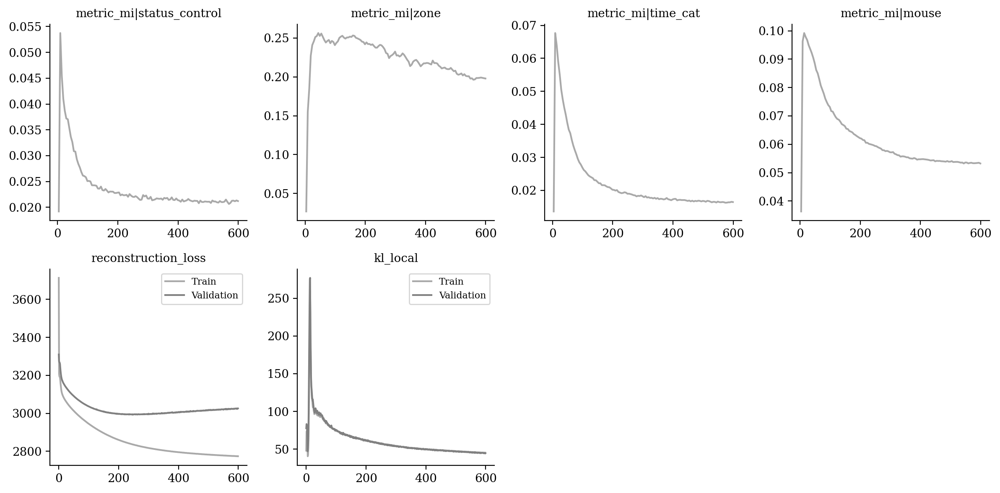

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

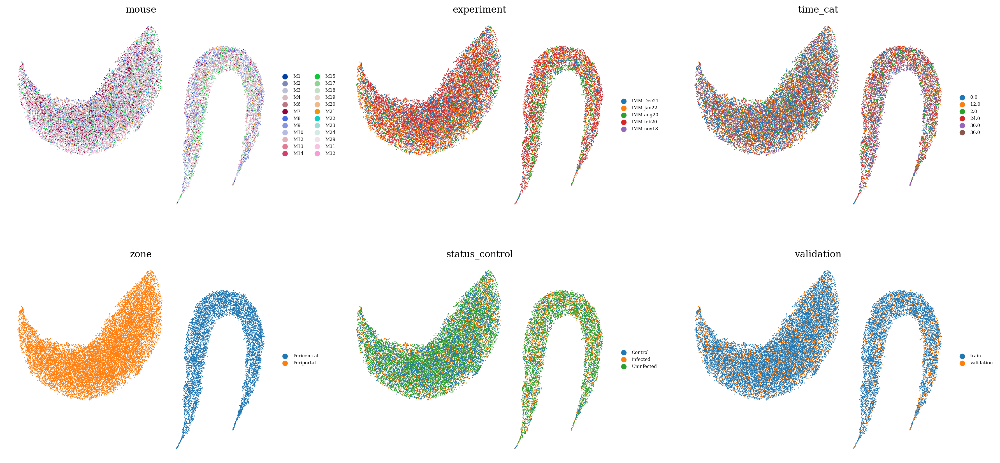

In [13]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

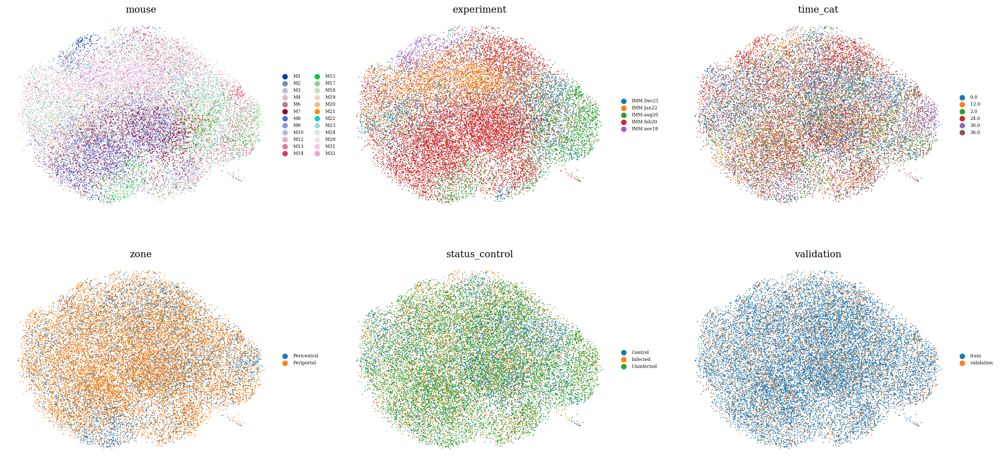

In [14]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )